In [1]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

ModuleNotFoundError: No module named 'google'

In [ ]:
#!pip install pycocotools --quiet
!apt-get install -y git
!git clone https://github.com/pytorch/vision.git
!git checkout v0.3.0

In [ ]:
!git checkout v0.3.0

In [ ]:
%cd ..

In [ ]:
!cp vision/references/detection/utils.py ./
!cp vision/references/detection/transforms.py ./
!cp vision/references/detection/coco_eval.py ./
!cp vision/references/detection/engine.py ./
!cp vision/references/detection/coco_utils.py ./

In [ ]:
!rm -rf vision
!tar -xvf test.tar
!pip install albumentations==0.4.6
!pip uninstall -y opencv-python-headless==4.5.5.62
!pip install opencv-python-headless==4.5.2.52
!pip install pandas
!pip install seaborn
!pip install scikit-learn
!rm test.tar

In [ ]:
!apt-get -y install gcc
!pip install pycocotools

In [1]:
import pandas as pd
import seaborn as sn
import numpy as np
import cv2
import os
import re
import traceback

os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

from PIL import Image

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2

import torch
import torchvision

from sklearn.metrics import confusion_matrix

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SequentialSampler

from engine import train_one_epoch, evaluate
from matplotlib import pyplot as plt

pd.options.mode.chained_assignment = None

DIR_INPUT = '.'
DIR_TRAIN = f'{DIR_INPUT}/test'
train_df = pd.read_csv(f'{DIR_INPUT}/test.csv')
train_df.shape

train_df['x'] = train_df['x'].astype(np.float16)
train_df['y'] = train_df['y'].astype(np.float16)
train_df['w'] = train_df['w'].astype(np.float16)
train_df['h'] = train_df['h'].astype(np.float16)

# sizes = []
# for entry in train_df["pathname"].unique():
# #     pathname = train_df["pathname"]
#     print(entry)
#     image = cv2.imread(f'{DIR_TRAIN}/{entry}', cv2.IMREAD_COLOR)
#     sizes.append(image.shape)

image_ids = train_df['image_id'].unique()
valid_ids = image_ids[-10:]
train_ids = image_ids[:-10]

valid_df = train_df[train_df['image_id'].isin(valid_ids)]
train_df = train_df[train_df['image_id'].isin(train_ids)]

valid_df.shape, train_df.shape
train_df['category_id'].unique().__len__()


11

In [2]:
!ls /content/drive/MyDrive

ls: cannot access '/content/drive/MyDrive': No such file or directory


In [3]:
class PhotosDataset(Dataset):

    def __init__(self, dataframe, image_dir, transforms=None, width=800, height=750):
        super().__init__()

        self.pathnames = dataframe['pathname'].unique()
        self.image_ids = dataframe['image_id'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms
        self.width = width
        self.height = height

    def __getitem__(self, index: int):
        
        newIndex = index - 1
        image_id = self.image_ids[newIndex]
        pathname = self.pathnames[newIndex]

        records = self.df[self.df['pathname'] == pathname]

        try:
          image = cv2.imread(f'{self.image_dir}/{pathname}', cv2.IMREAD_COLOR)
          image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        except:
          raise Exception("Check this pathname: " + pathname)
        
        image_width = image.shape[1]
        image_height = image.shape[0]
        
        image_resized_width = self.width
        image_resized_height = int(image_height * (self.width / image_width))
        
        image_resized = cv2.resize(image, (self.width,  image_resized_height),)
        image_resized /= 255.0

        
        records.loc[:, ['x', 'w']] *= self.width / image_width
        records.loc[:, ['y', 'h']] *= image_resized_height / image_height

        boxes = records[['x', 'y', 'w', 'h']].values
        
        boxes[:, 2] = np.clip(boxes[:, 0] + boxes[:, 2], 0, self.width)
        boxes[:, 3] = np.clip(boxes[:, 1] + boxes[:, 3], 0, image_resized_height)
        boxes[:, 0] = np.clip(boxes[:, 0], 0, self.width - 1)
        boxes[:, 1] = np.clip(boxes[:, 1], 0, image_resized_height - 1)

        
        area = records['w'] * records['h']
        area = torch.as_tensor(area.values, dtype=torch.float32)

        labels = torch.tensor(records['category_id'].values)
        
        # suppose all instances are not crowd
        iscrowd = torch.zeros((records.shape[0],), dtype=torch.int64)
        
        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        # target['masks'] = None
        target['pathname'] = torch.tensor([newIndex])
        target['area'] = area
        target['iscrowd'] = iscrowd
        target['image_id'] = torch.tensor([image_id])

        if self.transforms:
            sample = {
                'image': image_resized,
                'bboxes': target['boxes'],
                'labels': labels
            }
            sample = self.transforms(**sample)
            image_resized = sample['image']
            
            target['boxes'] = torch.stack(tuple(map(torch.tensor, zip(*sample['bboxes'])))).permute(1, 0)

        return image_resized, target, pathname

    def __len__(self) -> int:
        return self.image_ids.shape[0]

In [4]:
def get_train_transform():
    return A.Compose([
        
        A.Flip(0.5),
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)    

num_classes = 13  # 11 classes (wheat) + background

# get number of input features for the classifier
in_features = model.roi_heads.box_predictor.cls_score.in_features
print(in_features)
# replace the pre-trained head with a new one
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
#RESEARCH 

class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = PhotosDataset(train_df, DIR_TRAIN, get_train_transform())
valid_dataset = PhotosDataset(valid_df, DIR_TRAIN, get_valid_transform())

indices = torch.randperm(len(train_dataset)).tolist()

train_data_loader = DataLoader(
    train_dataset,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True,
    collate_fn=collate_fn
)

valid_data_loader = DataLoader(
    valid_dataset,
    batch_size=1,
    shuffle=False,
    num_workers=0,
    collate_fn=collate_fn
)

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')

1024


In [5]:
model.to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.0025, momentum=0.9, weight_decay=0.0005)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=50, gamma=0.1)

num_epochs = 200


loss_hist = Averager()

for epoch in range(num_epochs):
    # training for one epoch
    train_one_epoch(model, optimizer, train_data_loader, device, epoch, print_freq=10, unique_paths_num=train_df['pathname'].unique().__len__())
    # update the learning rate
    lr_scheduler.step()
    # evaluate on the test dataset
    evaluate(model, valid_data_loader, device=device)
#     loss_hist.reset()
#     itr = 1
#     for images, targets, image_ids in train_data_loader:
#         optimizer.zero_grad(set_to_none=True)
#         torch.cuda.empty_cache()
#         images = list(image.to(device) for image in images)
#         targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

#         # try:
#         loss_dict = model(images, targets)
#         # except:
#         #   itr += 1
#         #   print("skipped")
#         #   continue

#         losses = sum(loss for loss in loss_dict.values())
#         loss_value = losses.item()

#         loss_hist.send(loss_value)
        
#         losses.backward()
#         optimizer.step()
#         losses.detach()
#         if itr % 50 == 0:
#             print(f"Iteration #{itr} loss: {loss_value}")

#         itr += 8
#         if itr >= train_df['pathname'].unique().__len__():
#             break
#     # update the learning rate
#     if lr_scheduler is not None:
#         lr_scheduler.step()

#     print(f"Epoch #{epoch} loss: {loss_hist.value}")   

Epoch: [0]  [ 0/89]  eta: 0:03:51  lr: 0.000031  loss: 8.6911 (8.6911)  loss_classifier: 2.6644 (2.6644)  loss_box_reg: 0.6076 (0.6076)  loss_objectness: 5.1839 (5.1839)  loss_rpn_box_reg: 0.2351 (0.2351)  time: 2.5998  data: 1.1088  max mem: 4748
Epoch: [0]  [10/89]  eta: 0:00:50  lr: 0.000315  loss: 4.7153 (5.0185)  loss_classifier: 2.2845 (2.2460)  loss_box_reg: 0.6076 (0.5164)  loss_objectness: 1.7364 (2.0105)  loss_rpn_box_reg: 0.2351 (0.2457)  time: 0.6450  data: 0.1010  max mem: 10026
Epoch: [0]  [20/89]  eta: 0:00:39  lr: 0.000598  loss: 2.9310 (3.9205)  loss_classifier: 1.5144 (1.7549)  loss_box_reg: 0.5821 (0.5388)  loss_objectness: 0.7356 (1.3571)  loss_rpn_box_reg: 0.2422 (0.2698)  time: 0.4729  data: 0.0002  max mem: 10060
Epoch: [0]  [30/89]  eta: 0:00:31  lr: 0.000882  loss: 2.3762 (3.3814)  loss_classifier: 1.0388 (1.4970)  loss_box_reg: 0.5250 (0.5255)  loss_objectness: 0.4978 (1.0680)  loss_rpn_box_reg: 0.2858 (0.2910)  time: 0.4790  data: 0.0002  max mem: 10060
Epoch

Epoch: [2]  [40/89]  eta: 0:00:24  lr: 0.002500  loss: 1.6339 (1.5923)  loss_classifier: 0.5971 (0.5975)  loss_box_reg: 0.5151 (0.4881)  loss_objectness: 0.2684 (0.2681)  loss_rpn_box_reg: 0.2612 (0.2386)  time: 0.4870  data: 0.0002  max mem: 20518
Epoch: [2]  [50/89]  eta: 0:00:19  lr: 0.002500  loss: 1.6348 (1.6171)  loss_classifier: 0.5985 (0.6014)  loss_box_reg: 0.5001 (0.4922)  loss_objectness: 0.2789 (0.2751)  loss_rpn_box_reg: 0.2211 (0.2483)  time: 0.4904  data: 0.0002  max mem: 20518
Epoch: [2]  [60/89]  eta: 0:00:14  lr: 0.002500  loss: 1.6337 (1.6372)  loss_classifier: 0.6276 (0.6076)  loss_box_reg: 0.5083 (0.4956)  loss_objectness: 0.2885 (0.2820)  loss_rpn_box_reg: 0.1569 (0.2520)  time: 0.5066  data: 0.0002  max mem: 20518
Epoch: [2]  [70/89]  eta: 0:00:09  lr: 0.002500  loss: 1.5940 (1.6417)  loss_classifier: 0.6223 (0.6098)  loss_box_reg: 0.5140 (0.4981)  loss_objectness: 0.2691 (0.2812)  loss_rpn_box_reg: 0.2049 (0.2526)  time: 0.5048  data: 0.0002  max mem: 20518
Epoc

Epoch: [4]  [80/89]  eta: 0:00:04  lr: 0.002500  loss: 1.4399 (1.5377)  loss_classifier: 0.5063 (0.5565)  loss_box_reg: 0.4766 (0.4753)  loss_objectness: 0.2386 (0.2542)  loss_rpn_box_reg: 0.1972 (0.2517)  time: 0.4743  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0627 (0.0627)  evaluator_time: 0.0576 (0.0576)  time: 0.2860  data: 0.1648  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0608 (0.0614)  evaluator_time: 0.0832 (0.1106)  time: 0.3473  data: 0.1745  max mem: 20518
Test: Total time: 0:00:03 (0.3474 s / it)
Averaged stats: model_time: 0.0608 (0.0614)  evaluator_time: 0.0832 (0.1106)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.113
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.205
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.103
 Average Precision  (

Epoch: [7]  [ 0/89]  eta: 0:02:17  lr: 0.002500  loss: 1.4035 (1.4035)  loss_classifier: 0.5326 (0.5326)  loss_box_reg: 0.5381 (0.5381)  loss_objectness: 0.2048 (0.2048)  loss_rpn_box_reg: 0.1279 (0.1279)  time: 1.5394  data: 1.0654  max mem: 20518
Epoch: [7]  [10/89]  eta: 0:00:43  lr: 0.002500  loss: 1.3330 (1.2330)  loss_classifier: 0.4779 (0.4770)  loss_box_reg: 0.4036 (0.4063)  loss_objectness: 0.1836 (0.1826)  loss_rpn_box_reg: 0.1332 (0.1671)  time: 0.5564  data: 0.0971  max mem: 20518
Epoch: [7]  [20/89]  eta: 0:00:35  lr: 0.002500  loss: 1.3407 (1.3216)  loss_classifier: 0.4677 (0.4839)  loss_box_reg: 0.4380 (0.4329)  loss_objectness: 0.1836 (0.2053)  loss_rpn_box_reg: 0.1582 (0.1996)  time: 0.4698  data: 0.0003  max mem: 20518
Epoch: [7]  [30/89]  eta: 0:00:29  lr: 0.002500  loss: 1.3936 (1.3648)  loss_classifier: 0.4847 (0.4938)  loss_box_reg: 0.4624 (0.4434)  loss_objectness: 0.2158 (0.2077)  loss_rpn_box_reg: 0.2321 (0.2198)  time: 0.4711  data: 0.0002  max mem: 20518
Epoc

Epoch: [9]  [40/89]  eta: 0:00:24  lr: 0.002500  loss: 1.3549 (1.3275)  loss_classifier: 0.4865 (0.4819)  loss_box_reg: 0.4550 (0.4304)  loss_objectness: 0.2042 (0.2019)  loss_rpn_box_reg: 0.2509 (0.2133)  time: 0.4670  data: 0.0003  max mem: 20518
Epoch: [9]  [50/89]  eta: 0:00:19  lr: 0.002500  loss: 1.4372 (1.3603)  loss_classifier: 0.4980 (0.4918)  loss_box_reg: 0.4724 (0.4399)  loss_objectness: 0.2190 (0.2076)  loss_rpn_box_reg: 0.1885 (0.2209)  time: 0.4805  data: 0.0002  max mem: 20518
Epoch: [9]  [60/89]  eta: 0:00:14  lr: 0.002500  loss: 1.4204 (1.3822)  loss_classifier: 0.5370 (0.4992)  loss_box_reg: 0.4728 (0.4433)  loss_objectness: 0.2108 (0.2155)  loss_rpn_box_reg: 0.1487 (0.2243)  time: 0.5073  data: 0.0002  max mem: 20518
Epoch: [9]  [70/89]  eta: 0:00:09  lr: 0.002500  loss: 1.3846 (1.3869)  loss_classifier: 0.4986 (0.4994)  loss_box_reg: 0.4607 (0.4460)  loss_objectness: 0.2252 (0.2174)  loss_rpn_box_reg: 0.1692 (0.2241)  time: 0.5024  data: 0.0002  max mem: 20518
Epoc

Epoch: [11]  [80/89]  eta: 0:00:04  lr: 0.002500  loss: 1.3232 (1.3504)  loss_classifier: 0.4551 (0.4803)  loss_box_reg: 0.4237 (0.4351)  loss_objectness: 0.1884 (0.2070)  loss_rpn_box_reg: 0.1868 (0.2279)  time: 0.4560  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0644 (0.0644)  evaluator_time: 0.0528 (0.0528)  time: 0.2819  data: 0.1638  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0597 (0.0603)  evaluator_time: 0.0809 (0.1115)  time: 0.3453  data: 0.1727  max mem: 20518
Test: Total time: 0:00:03 (0.3454 s / it)
Averaged stats: model_time: 0.0597 (0.0603)  evaluator_time: 0.0809 (0.1115)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.115
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.219
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.107
 Average Precision  

Epoch: [14]  [ 0/89]  eta: 0:02:14  lr: 0.002500  loss: 1.1529 (1.1529)  loss_classifier: 0.4576 (0.4576)  loss_box_reg: 0.4704 (0.4704)  loss_objectness: 0.1229 (0.1229)  loss_rpn_box_reg: 0.1020 (0.1020)  time: 1.5106  data: 1.0391  max mem: 20518
Epoch: [14]  [10/89]  eta: 0:00:43  lr: 0.002500  loss: 1.1018 (1.0400)  loss_classifier: 0.3671 (0.3898)  loss_box_reg: 0.3700 (0.3551)  loss_objectness: 0.1387 (0.1426)  loss_rpn_box_reg: 0.1065 (0.1526)  time: 0.5493  data: 0.0946  max mem: 20518
Epoch: [14]  [20/89]  eta: 0:00:35  lr: 0.002500  loss: 1.1018 (1.1539)  loss_classifier: 0.4076 (0.4200)  loss_box_reg: 0.4112 (0.3910)  loss_objectness: 0.1451 (0.1635)  loss_rpn_box_reg: 0.1328 (0.1794)  time: 0.4682  data: 0.0002  max mem: 20518
Epoch: [14]  [30/89]  eta: 0:00:29  lr: 0.002500  loss: 1.1878 (1.1809)  loss_classifier: 0.4185 (0.4268)  loss_box_reg: 0.4152 (0.3996)  loss_objectness: 0.1573 (0.1612)  loss_rpn_box_reg: 0.2148 (0.1934)  time: 0.4729  data: 0.0003  max mem: 20518


Epoch: [16]  [40/89]  eta: 0:00:23  lr: 0.002500  loss: 1.2348 (1.1955)  loss_classifier: 0.4410 (0.4252)  loss_box_reg: 0.4008 (0.4017)  loss_objectness: 0.1740 (0.1702)  loss_rpn_box_reg: 0.2269 (0.1984)  time: 0.4554  data: 0.0001  max mem: 20518
Epoch: [16]  [50/89]  eta: 0:00:18  lr: 0.002500  loss: 1.2968 (1.2303)  loss_classifier: 0.4649 (0.4388)  loss_box_reg: 0.4233 (0.4078)  loss_objectness: 0.1821 (0.1793)  loss_rpn_box_reg: 0.1794 (0.2045)  time: 0.4671  data: 0.0002  max mem: 20518
Epoch: [16]  [60/89]  eta: 0:00:14  lr: 0.002500  loss: 1.3629 (1.2604)  loss_classifier: 0.5117 (0.4517)  loss_box_reg: 0.4290 (0.4123)  loss_objectness: 0.1977 (0.1874)  loss_rpn_box_reg: 0.1382 (0.2090)  time: 0.5009  data: 0.0002  max mem: 20518
Epoch: [16]  [70/89]  eta: 0:00:09  lr: 0.002500  loss: 1.3629 (1.2686)  loss_classifier: 0.5030 (0.4541)  loss_box_reg: 0.4287 (0.4161)  loss_objectness: 0.2069 (0.1900)  loss_rpn_box_reg: 0.1629 (0.2084)  time: 0.4948  data: 0.0002  max mem: 20518


Epoch: [18]  [80/89]  eta: 0:00:04  lr: 0.002500  loss: 1.1882 (1.2423)  loss_classifier: 0.4165 (0.4405)  loss_box_reg: 0.3804 (0.4055)  loss_objectness: 0.1789 (0.1846)  loss_rpn_box_reg: 0.1679 (0.2117)  time: 0.4617  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0631 (0.0631)  evaluator_time: 0.0501 (0.0501)  time: 0.2778  data: 0.1637  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0599 (0.0605)  evaluator_time: 0.0782 (0.1107)  time: 0.3447  data: 0.1727  max mem: 20518
Test: Total time: 0:00:03 (0.3448 s / it)
Averaged stats: model_time: 0.0599 (0.0605)  evaluator_time: 0.0782 (0.1107)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.215
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.338
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.251
 Average Precision  

Epoch: [21]  [ 0/89]  eta: 0:02:21  lr: 0.002500  loss: 1.1343 (1.1343)  loss_classifier: 0.4040 (0.4040)  loss_box_reg: 0.4676 (0.4676)  loss_objectness: 0.1479 (0.1479)  loss_rpn_box_reg: 0.1148 (0.1148)  time: 1.5859  data: 1.1262  max mem: 20518
Epoch: [21]  [10/89]  eta: 0:00:43  lr: 0.002500  loss: 1.0004 (0.9612)  loss_classifier: 0.3408 (0.3509)  loss_box_reg: 0.3471 (0.3358)  loss_objectness: 0.1443 (0.1265)  loss_rpn_box_reg: 0.1148 (0.1480)  time: 0.5558  data: 0.1025  max mem: 20518
Epoch: [21]  [20/89]  eta: 0:00:35  lr: 0.002500  loss: 1.0313 (1.0798)  loss_classifier: 0.3900 (0.3872)  loss_box_reg: 0.3907 (0.3712)  loss_objectness: 0.1443 (0.1466)  loss_rpn_box_reg: 0.1308 (0.1748)  time: 0.4645  data: 0.0001  max mem: 20518
Epoch: [21]  [30/89]  eta: 0:00:29  lr: 0.002500  loss: 1.1728 (1.1027)  loss_classifier: 0.4082 (0.3923)  loss_box_reg: 0.3988 (0.3787)  loss_objectness: 0.1484 (0.1444)  loss_rpn_box_reg: 0.2108 (0.1872)  time: 0.4672  data: 0.0001  max mem: 20518


Epoch: [23]  [40/89]  eta: 0:00:24  lr: 0.002500  loss: 1.1412 (1.1073)  loss_classifier: 0.4033 (0.3952)  loss_box_reg: 0.3750 (0.3787)  loss_objectness: 0.1581 (0.1474)  loss_rpn_box_reg: 0.2020 (0.1860)  time: 0.4671  data: 0.0002  max mem: 20518
Epoch: [23]  [50/89]  eta: 0:00:19  lr: 0.002500  loss: 1.2162 (1.1500)  loss_classifier: 0.4413 (0.4079)  loss_box_reg: 0.4135 (0.3892)  loss_objectness: 0.1895 (0.1592)  loss_rpn_box_reg: 0.1538 (0.1937)  time: 0.4810  data: 0.0002  max mem: 20518
Epoch: [23]  [60/89]  eta: 0:00:14  lr: 0.002500  loss: 1.2966 (1.1779)  loss_classifier: 0.4620 (0.4184)  loss_box_reg: 0.4184 (0.3950)  loss_objectness: 0.1927 (0.1666)  loss_rpn_box_reg: 0.1442 (0.1978)  time: 0.5047  data: 0.0002  max mem: 20518
Epoch: [23]  [70/89]  eta: 0:00:09  lr: 0.002500  loss: 1.2487 (1.1873)  loss_classifier: 0.4468 (0.4223)  loss_box_reg: 0.4103 (0.3986)  loss_objectness: 0.1855 (0.1686)  loss_rpn_box_reg: 0.1685 (0.1978)  time: 0.4946  data: 0.0002  max mem: 20518


Epoch: [25]  [80/89]  eta: 0:00:04  lr: 0.002500  loss: 1.1254 (1.1606)  loss_classifier: 0.4042 (0.4084)  loss_box_reg: 0.3673 (0.3882)  loss_objectness: 0.1704 (0.1633)  loss_rpn_box_reg: 0.1554 (0.2007)  time: 0.4628  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0623 (0.0623)  evaluator_time: 0.0508 (0.0508)  time: 0.2789  data: 0.1650  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0602 (0.0613)  evaluator_time: 0.0687 (0.1054)  time: 0.3406  data: 0.1731  max mem: 20518
Test: Total time: 0:00:03 (0.3408 s / it)
Averaged stats: model_time: 0.0602 (0.0613)  evaluator_time: 0.0687 (0.1054)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.221
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.337
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.235
 Average Precision  

Epoch: [28]  [ 0/89]  eta: 0:02:17  lr: 0.002500  loss: 0.9675 (0.9675)  loss_classifier: 0.3477 (0.3477)  loss_box_reg: 0.4202 (0.4202)  loss_objectness: 0.1116 (0.1116)  loss_rpn_box_reg: 0.0881 (0.0881)  time: 1.5402  data: 1.0745  max mem: 20518
Epoch: [28]  [10/89]  eta: 0:00:42  lr: 0.002500  loss: 0.9215 (0.8740)  loss_classifier: 0.2829 (0.3150)  loss_box_reg: 0.3227 (0.3134)  loss_objectness: 0.1116 (0.1080)  loss_rpn_box_reg: 0.1130 (0.1376)  time: 0.5424  data: 0.0978  max mem: 20518
Epoch: [28]  [20/89]  eta: 0:00:35  lr: 0.002500  loss: 0.9729 (1.0055)  loss_classifier: 0.3807 (0.3602)  loss_box_reg: 0.3683 (0.3535)  loss_objectness: 0.1185 (0.1280)  loss_rpn_box_reg: 0.1130 (0.1638)  time: 0.4618  data: 0.0002  max mem: 20518
Epoch: [28]  [30/89]  eta: 0:00:29  lr: 0.002500  loss: 1.1034 (1.0247)  loss_classifier: 0.3936 (0.3646)  loss_box_reg: 0.3801 (0.3592)  loss_objectness: 0.1225 (0.1247)  loss_rpn_box_reg: 0.1964 (0.1761)  time: 0.4651  data: 0.0002  max mem: 20518


Epoch: [30]  [40/89]  eta: 0:00:24  lr: 0.002500  loss: 1.0956 (1.0406)  loss_classifier: 0.3793 (0.3617)  loss_box_reg: 0.3844 (0.3619)  loss_objectness: 0.1481 (0.1389)  loss_rpn_box_reg: 0.2062 (0.1781)  time: 0.4682  data: 0.0002  max mem: 20518
Epoch: [30]  [50/89]  eta: 0:00:18  lr: 0.002500  loss: 1.1749 (1.0797)  loss_classifier: 0.4142 (0.3757)  loss_box_reg: 0.3884 (0.3704)  loss_objectness: 0.1635 (0.1467)  loss_rpn_box_reg: 0.1494 (0.1868)  time: 0.4703  data: 0.0002  max mem: 20518
Epoch: [30]  [60/89]  eta: 0:00:14  lr: 0.002500  loss: 1.2107 (1.1110)  loss_classifier: 0.4526 (0.3888)  loss_box_reg: 0.4090 (0.3770)  loss_objectness: 0.1681 (0.1538)  loss_rpn_box_reg: 0.1316 (0.1914)  time: 0.4987  data: 0.0002  max mem: 20518
Epoch: [30]  [70/89]  eta: 0:00:09  lr: 0.002500  loss: 1.1902 (1.1161)  loss_classifier: 0.4381 (0.3913)  loss_box_reg: 0.3963 (0.3785)  loss_objectness: 0.1650 (0.1558)  loss_rpn_box_reg: 0.1485 (0.1905)  time: 0.5031  data: 0.0002  max mem: 20518


Epoch: [32]  [80/89]  eta: 0:00:04  lr: 0.002500  loss: 1.0297 (1.0861)  loss_classifier: 0.3761 (0.3797)  loss_box_reg: 0.3588 (0.3692)  loss_objectness: 0.1536 (0.1474)  loss_rpn_box_reg: 0.1439 (0.1897)  time: 0.4625  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0629 (0.0629)  evaluator_time: 0.0523 (0.0523)  time: 0.2787  data: 0.1626  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0604 (0.0605)  evaluator_time: 0.0802 (0.1093)  time: 0.3427  data: 0.1721  max mem: 20518
Test: Total time: 0:00:03 (0.3428 s / it)
Averaged stats: model_time: 0.0604 (0.0605)  evaluator_time: 0.0802 (0.1093)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.217
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.324
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.227
 Average Precision  

Epoch: [35]  [ 0/89]  eta: 0:02:16  lr: 0.002500  loss: 0.9777 (0.9777)  loss_classifier: 0.3639 (0.3639)  loss_box_reg: 0.3993 (0.3993)  loss_objectness: 0.1221 (0.1221)  loss_rpn_box_reg: 0.0924 (0.0924)  time: 1.5365  data: 1.0577  max mem: 20518
Epoch: [35]  [10/89]  eta: 0:00:43  lr: 0.002500  loss: 0.8302 (0.8386)  loss_classifier: 0.2539 (0.2963)  loss_box_reg: 0.3207 (0.3108)  loss_objectness: 0.1221 (0.1024)  loss_rpn_box_reg: 0.0989 (0.1291)  time: 0.5507  data: 0.0963  max mem: 20518
Epoch: [35]  [20/89]  eta: 0:00:35  lr: 0.002500  loss: 0.8906 (0.9482)  loss_classifier: 0.3231 (0.3330)  loss_box_reg: 0.3542 (0.3433)  loss_objectness: 0.1237 (0.1172)  loss_rpn_box_reg: 0.1112 (0.1547)  time: 0.4651  data: 0.0002  max mem: 20518
Epoch: [35]  [30/89]  eta: 0:00:29  lr: 0.002500  loss: 1.0076 (0.9614)  loss_classifier: 0.3431 (0.3356)  loss_box_reg: 0.3650 (0.3452)  loss_objectness: 0.1083 (0.1170)  loss_rpn_box_reg: 0.1868 (0.1636)  time: 0.4685  data: 0.0002  max mem: 20518


Epoch: [37]  [40/89]  eta: 0:00:24  lr: 0.002500  loss: 1.0063 (0.9792)  loss_classifier: 0.3562 (0.3379)  loss_box_reg: 0.3499 (0.3435)  loss_objectness: 0.1329 (0.1250)  loss_rpn_box_reg: 0.1861 (0.1728)  time: 0.4705  data: 0.0002  max mem: 20518
Epoch: [37]  [50/89]  eta: 0:00:19  lr: 0.002500  loss: 1.0716 (1.0131)  loss_classifier: 0.3750 (0.3507)  loss_box_reg: 0.3654 (0.3516)  loss_objectness: 0.1496 (0.1317)  loss_rpn_box_reg: 0.1453 (0.1791)  time: 0.4757  data: 0.0002  max mem: 20518
Epoch: [37]  [60/89]  eta: 0:00:14  lr: 0.002500  loss: 1.1544 (1.0422)  loss_classifier: 0.4143 (0.3605)  loss_box_reg: 0.3848 (0.3595)  loss_objectness: 0.1540 (0.1388)  loss_rpn_box_reg: 0.1340 (0.1834)  time: 0.5027  data: 0.0002  max mem: 20518
Epoch: [37]  [70/89]  eta: 0:00:09  lr: 0.002500  loss: 1.1261 (1.0524)  loss_classifier: 0.3963 (0.3653)  loss_box_reg: 0.3753 (0.3622)  loss_objectness: 0.1590 (0.1422)  loss_rpn_box_reg: 0.1462 (0.1827)  time: 0.4982  data: 0.0002  max mem: 20518


Epoch: [39]  [80/89]  eta: 0:00:04  lr: 0.002500  loss: 1.0134 (1.0336)  loss_classifier: 0.3622 (0.3573)  loss_box_reg: 0.3773 (0.3595)  loss_objectness: 0.1398 (0.1352)  loss_rpn_box_reg: 0.1564 (0.1816)  time: 0.4709  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0625 (0.0625)  evaluator_time: 0.0566 (0.0566)  time: 0.2827  data: 0.1628  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0608 (0.0610)  evaluator_time: 0.0800 (0.1091)  time: 0.3446  data: 0.1737  max mem: 20518
Test: Total time: 0:00:03 (0.3449 s / it)
Averaged stats: model_time: 0.0608 (0.0610)  evaluator_time: 0.0800 (0.1091)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.183
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.278
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.209
 Average Precision  

Epoch: [42]  [ 0/89]  eta: 0:02:14  lr: 0.002500  loss: 0.9587 (0.9587)  loss_classifier: 0.3531 (0.3531)  loss_box_reg: 0.4115 (0.4115)  loss_objectness: 0.1104 (0.1104)  loss_rpn_box_reg: 0.0837 (0.0837)  time: 1.5089  data: 1.0418  max mem: 20518
Epoch: [42]  [10/89]  eta: 0:00:43  lr: 0.002500  loss: 0.8372 (0.8045)  loss_classifier: 0.2622 (0.2784)  loss_box_reg: 0.3190 (0.3007)  loss_objectness: 0.1049 (0.0904)  loss_rpn_box_reg: 0.0919 (0.1350)  time: 0.5519  data: 0.0949  max mem: 20518
Epoch: [42]  [20/89]  eta: 0:00:35  lr: 0.002500  loss: 0.9039 (0.9122)  loss_classifier: 0.3255 (0.3159)  loss_box_reg: 0.3364 (0.3307)  loss_objectness: 0.1049 (0.1038)  loss_rpn_box_reg: 0.1243 (0.1618)  time: 0.4714  data: 0.0002  max mem: 20518
Epoch: [42]  [30/89]  eta: 0:00:29  lr: 0.002500  loss: 0.9810 (0.9293)  loss_classifier: 0.3296 (0.3192)  loss_box_reg: 0.3559 (0.3354)  loss_objectness: 0.1050 (0.1032)  loss_rpn_box_reg: 0.2001 (0.1715)  time: 0.4736  data: 0.0002  max mem: 20518


Epoch: [44]  [40/89]  eta: 0:00:24  lr: 0.002500  loss: 0.9693 (0.9280)  loss_classifier: 0.3227 (0.3207)  loss_box_reg: 0.3257 (0.3312)  loss_objectness: 0.1212 (0.1177)  loss_rpn_box_reg: 0.1733 (0.1583)  time: 0.4690  data: 0.0002  max mem: 20518
Epoch: [44]  [50/89]  eta: 0:00:19  lr: 0.002500  loss: 0.9755 (0.9574)  loss_classifier: 0.3597 (0.3304)  loss_box_reg: 0.3423 (0.3378)  loss_objectness: 0.1323 (0.1225)  loss_rpn_box_reg: 0.1351 (0.1667)  time: 0.4764  data: 0.0002  max mem: 20518
Epoch: [44]  [60/89]  eta: 0:00:14  lr: 0.002500  loss: 1.1525 (0.9909)  loss_classifier: 0.3791 (0.3431)  loss_box_reg: 0.3827 (0.3467)  loss_objectness: 0.1262 (0.1296)  loss_rpn_box_reg: 0.1269 (0.1714)  time: 0.5000  data: 0.0002  max mem: 20518
Epoch: [44]  [70/89]  eta: 0:00:09  lr: 0.002500  loss: 1.1182 (1.0013)  loss_classifier: 0.3812 (0.3480)  loss_box_reg: 0.3770 (0.3490)  loss_objectness: 0.1429 (0.1321)  loss_rpn_box_reg: 0.1545 (0.1722)  time: 0.4997  data: 0.0002  max mem: 20518


Epoch: [46]  [80/89]  eta: 0:00:04  lr: 0.002500  loss: 1.0169 (0.9936)  loss_classifier: 0.3677 (0.3439)  loss_box_reg: 0.3444 (0.3441)  loss_objectness: 0.1307 (0.1298)  loss_rpn_box_reg: 0.1447 (0.1757)  time: 0.4623  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0634 (0.0634)  evaluator_time: 0.0556 (0.0556)  time: 0.2835  data: 0.1637  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0602 (0.0612)  evaluator_time: 0.0837 (0.1124)  time: 0.3490  data: 0.1746  max mem: 20518
Test: Total time: 0:00:03 (0.3492 s / it)
Averaged stats: model_time: 0.0602 (0.0612)  evaluator_time: 0.0837 (0.1124)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.295
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.221
 Average Precision  

Epoch: [49]  [ 0/89]  eta: 0:02:14  lr: 0.002500  loss: 0.8707 (0.8707)  loss_classifier: 0.3118 (0.3118)  loss_box_reg: 0.3766 (0.3766)  loss_objectness: 0.0885 (0.0885)  loss_rpn_box_reg: 0.0937 (0.0937)  time: 1.5070  data: 1.0321  max mem: 20518
Epoch: [49]  [10/89]  eta: 0:00:43  lr: 0.002500  loss: 0.7727 (0.7868)  loss_classifier: 0.2675 (0.2749)  loss_box_reg: 0.2963 (0.2884)  loss_objectness: 0.1008 (0.0964)  loss_rpn_box_reg: 0.1002 (0.1271)  time: 0.5551  data: 0.0940  max mem: 20518
Epoch: [49]  [20/89]  eta: 0:00:35  lr: 0.002500  loss: 0.7727 (0.8782)  loss_classifier: 0.2721 (0.3065)  loss_box_reg: 0.3203 (0.3186)  loss_objectness: 0.1106 (0.1045)  loss_rpn_box_reg: 0.1093 (0.1485)  time: 0.4694  data: 0.0002  max mem: 20518
Epoch: [49]  [30/89]  eta: 0:00:29  lr: 0.002500  loss: 0.8888 (0.8834)  loss_classifier: 0.3046 (0.3039)  loss_box_reg: 0.3391 (0.3199)  loss_objectness: 0.1038 (0.1009)  loss_rpn_box_reg: 0.1703 (0.1587)  time: 0.4673  data: 0.0002  max mem: 20518


Epoch: [51]  [40/89]  eta: 0:00:24  lr: 0.000250  loss: 0.8857 (0.8566)  loss_classifier: 0.3078 (0.2926)  loss_box_reg: 0.3046 (0.3119)  loss_objectness: 0.1041 (0.1038)  loss_rpn_box_reg: 0.1649 (0.1484)  time: 0.4572  data: 0.0002  max mem: 20518
Epoch: [51]  [50/89]  eta: 0:00:18  lr: 0.000250  loss: 0.9397 (0.8865)  loss_classifier: 0.3237 (0.3029)  loss_box_reg: 0.3407 (0.3176)  loss_objectness: 0.1268 (0.1100)  loss_rpn_box_reg: 0.1415 (0.1560)  time: 0.4665  data: 0.0002  max mem: 20518
Epoch: [51]  [60/89]  eta: 0:00:14  lr: 0.000250  loss: 1.0255 (0.9126)  loss_classifier: 0.3492 (0.3121)  loss_box_reg: 0.3407 (0.3235)  loss_objectness: 0.1327 (0.1150)  loss_rpn_box_reg: 0.1087 (0.1620)  time: 0.4983  data: 0.0002  max mem: 20518
Epoch: [51]  [70/89]  eta: 0:00:09  lr: 0.000250  loss: 1.0108 (0.9198)  loss_classifier: 0.3410 (0.3155)  loss_box_reg: 0.3367 (0.3261)  loss_objectness: 0.1294 (0.1163)  loss_rpn_box_reg: 0.1238 (0.1619)  time: 0.4984  data: 0.0002  max mem: 20518


Epoch: [53]  [80/89]  eta: 0:00:04  lr: 0.000250  loss: 0.9271 (0.9139)  loss_classifier: 0.3232 (0.3138)  loss_box_reg: 0.3290 (0.3261)  loss_objectness: 0.1196 (0.1098)  loss_rpn_box_reg: 0.1428 (0.1642)  time: 0.4626  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0633 (0.0633)  evaluator_time: 0.0469 (0.0469)  time: 0.2789  data: 0.1679  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0598 (0.0602)  evaluator_time: 0.0659 (0.1020)  time: 0.3360  data: 0.1730  max mem: 20518
Test: Total time: 0:00:03 (0.3361 s / it)
Averaged stats: model_time: 0.0598 (0.0602)  evaluator_time: 0.0659 (0.1020)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.211
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.324
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.227
 Average Precision  

Epoch: [56]  [ 0/89]  eta: 0:02:16  lr: 0.000250  loss: 0.8003 (0.8003)  loss_classifier: 0.2850 (0.2850)  loss_box_reg: 0.3548 (0.3548)  loss_objectness: 0.0902 (0.0902)  loss_rpn_box_reg: 0.0702 (0.0702)  time: 1.5285  data: 1.0598  max mem: 20518
Epoch: [56]  [10/89]  eta: 0:00:43  lr: 0.000250  loss: 0.7403 (0.6947)  loss_classifier: 0.2518 (0.2446)  loss_box_reg: 0.2706 (0.2631)  loss_objectness: 0.0902 (0.0772)  loss_rpn_box_reg: 0.0818 (0.1098)  time: 0.5447  data: 0.0965  max mem: 20518
Epoch: [56]  [20/89]  eta: 0:00:35  lr: 0.000250  loss: 0.7627 (0.8042)  loss_classifier: 0.3003 (0.2858)  loss_box_reg: 0.2928 (0.2953)  loss_objectness: 0.0929 (0.0891)  loss_rpn_box_reg: 0.0848 (0.1339)  time: 0.4612  data: 0.0002  max mem: 20518
Epoch: [56]  [30/89]  eta: 0:00:29  lr: 0.000250  loss: 0.8631 (0.8075)  loss_classifier: 0.2997 (0.2794)  loss_box_reg: 0.3206 (0.2982)  loss_objectness: 0.0781 (0.0869)  loss_rpn_box_reg: 0.1642 (0.1430)  time: 0.4658  data: 0.0002  max mem: 20518


Epoch: [58]  [40/89]  eta: 0:00:24  lr: 0.000250  loss: 0.8585 (0.8219)  loss_classifier: 0.2778 (0.2805)  loss_box_reg: 0.3081 (0.3034)  loss_objectness: 0.0965 (0.0936)  loss_rpn_box_reg: 0.1651 (0.1444)  time: 0.4645  data: 0.0002  max mem: 20518
Epoch: [58]  [50/89]  eta: 0:00:19  lr: 0.000250  loss: 0.9033 (0.8554)  loss_classifier: 0.3223 (0.2916)  loss_box_reg: 0.3096 (0.3102)  loss_objectness: 0.1117 (0.0992)  loss_rpn_box_reg: 0.1271 (0.1544)  time: 0.4709  data: 0.0002  max mem: 20518
Epoch: [58]  [60/89]  eta: 0:00:14  lr: 0.000250  loss: 0.9622 (0.8835)  loss_classifier: 0.3557 (0.3021)  loss_box_reg: 0.3518 (0.3181)  loss_objectness: 0.1230 (0.1044)  loss_rpn_box_reg: 0.1158 (0.1589)  time: 0.5052  data: 0.0002  max mem: 20518
Epoch: [58]  [70/89]  eta: 0:00:09  lr: 0.000250  loss: 0.9567 (0.8901)  loss_classifier: 0.3331 (0.3052)  loss_box_reg: 0.3428 (0.3213)  loss_objectness: 0.1133 (0.1053)  loss_rpn_box_reg: 0.1235 (0.1584)  time: 0.5018  data: 0.0002  max mem: 20518


Epoch: [60]  [80/89]  eta: 0:00:04  lr: 0.000250  loss: 0.8751 (0.8867)  loss_classifier: 0.3145 (0.3051)  loss_box_reg: 0.3235 (0.3203)  loss_objectness: 0.1087 (0.1050)  loss_rpn_box_reg: 0.1250 (0.1563)  time: 0.4556  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0625 (0.0625)  evaluator_time: 0.0471 (0.0471)  time: 0.2793  data: 0.1689  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0599 (0.0607)  evaluator_time: 0.0654 (0.1041)  time: 0.3412  data: 0.1756  max mem: 20518
Test: Total time: 0:00:03 (0.3414 s / it)
Averaged stats: model_time: 0.0599 (0.0607)  evaluator_time: 0.0654 (0.1041)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.200
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.313
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.228
 Average Precision  

Epoch: [63]  [ 0/89]  eta: 0:02:11  lr: 0.000250  loss: 0.7433 (0.7433)  loss_classifier: 0.2860 (0.2860)  loss_box_reg: 0.3203 (0.3203)  loss_objectness: 0.0619 (0.0619)  loss_rpn_box_reg: 0.0750 (0.0750)  time: 1.4726  data: 1.0195  max mem: 20518
Epoch: [63]  [10/89]  eta: 0:00:42  lr: 0.000250  loss: 0.6507 (0.6557)  loss_classifier: 0.2200 (0.2275)  loss_box_reg: 0.2508 (0.2556)  loss_objectness: 0.0761 (0.0686)  loss_rpn_box_reg: 0.0851 (0.1041)  time: 0.5320  data: 0.0928  max mem: 20518
Epoch: [63]  [20/89]  eta: 0:00:34  lr: 0.000250  loss: 0.7017 (0.7697)  loss_classifier: 0.2616 (0.2679)  loss_box_reg: 0.2969 (0.2902)  loss_objectness: 0.0797 (0.0835)  loss_rpn_box_reg: 0.0851 (0.1280)  time: 0.4588  data: 0.0002  max mem: 20518
Epoch: [63]  [30/89]  eta: 0:00:28  lr: 0.000250  loss: 0.8203 (0.7798)  loss_classifier: 0.2779 (0.2667)  loss_box_reg: 0.3100 (0.2935)  loss_objectness: 0.0811 (0.0813)  loss_rpn_box_reg: 0.1608 (0.1382)  time: 0.4626  data: 0.0002  max mem: 20518


Epoch: [65]  [40/89]  eta: 0:00:24  lr: 0.000250  loss: 0.8193 (0.8125)  loss_classifier: 0.2886 (0.2804)  loss_box_reg: 0.2939 (0.2995)  loss_objectness: 0.0916 (0.0925)  loss_rpn_box_reg: 0.1708 (0.1401)  time: 0.4635  data: 0.0002  max mem: 20518
Epoch: [65]  [50/89]  eta: 0:00:19  lr: 0.000250  loss: 0.8518 (0.8394)  loss_classifier: 0.3065 (0.2898)  loss_box_reg: 0.3006 (0.3052)  loss_objectness: 0.1015 (0.0984)  loss_rpn_box_reg: 0.1294 (0.1460)  time: 0.4773  data: 0.0002  max mem: 20518
Epoch: [65]  [60/89]  eta: 0:00:14  lr: 0.000250  loss: 0.9980 (0.8661)  loss_classifier: 0.3286 (0.2984)  loss_box_reg: 0.3516 (0.3138)  loss_objectness: 0.1000 (0.1022)  loss_rpn_box_reg: 0.1038 (0.1517)  time: 0.5054  data: 0.0002  max mem: 20518
Epoch: [65]  [70/89]  eta: 0:00:09  lr: 0.000250  loss: 0.9958 (0.8732)  loss_classifier: 0.3286 (0.3015)  loss_box_reg: 0.3496 (0.3156)  loss_objectness: 0.1141 (0.1046)  loss_rpn_box_reg: 0.1156 (0.1514)  time: 0.4989  data: 0.0002  max mem: 20518


Epoch: [67]  [80/89]  eta: 0:00:04  lr: 0.000250  loss: 0.8551 (0.8574)  loss_classifier: 0.3029 (0.2928)  loss_box_reg: 0.3175 (0.3086)  loss_objectness: 0.1076 (0.1010)  loss_rpn_box_reg: 0.1267 (0.1549)  time: 0.4606  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0637 (0.0637)  evaluator_time: 0.0457 (0.0457)  time: 0.2794  data: 0.1691  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0598 (0.0603)  evaluator_time: 0.0663 (0.1001)  time: 0.3340  data: 0.1729  max mem: 20518
Test: Total time: 0:00:03 (0.3342 s / it)
Averaged stats: model_time: 0.0598 (0.0603)  evaluator_time: 0.0663 (0.1001)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.322
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.227
 Average Precision  

Epoch: [70]  [ 0/89]  eta: 0:02:16  lr: 0.000250  loss: 0.6810 (0.6810)  loss_classifier: 0.2372 (0.2372)  loss_box_reg: 0.3126 (0.3126)  loss_objectness: 0.0612 (0.0612)  loss_rpn_box_reg: 0.0700 (0.0700)  time: 1.5365  data: 1.0691  max mem: 20518
Epoch: [70]  [10/89]  eta: 0:00:43  lr: 0.000250  loss: 0.6607 (0.6532)  loss_classifier: 0.2231 (0.2252)  loss_box_reg: 0.2758 (0.2548)  loss_objectness: 0.0645 (0.0665)  loss_rpn_box_reg: 0.0784 (0.1068)  time: 0.5472  data: 0.0974  max mem: 20518
Epoch: [70]  [20/89]  eta: 0:00:35  lr: 0.000250  loss: 0.6754 (0.7627)  loss_classifier: 0.2447 (0.2645)  loss_box_reg: 0.2861 (0.2881)  loss_objectness: 0.0740 (0.0788)  loss_rpn_box_reg: 0.0898 (0.1313)  time: 0.4703  data: 0.0002  max mem: 20518
Epoch: [70]  [30/89]  eta: 0:00:29  lr: 0.000250  loss: 0.8329 (0.7655)  loss_classifier: 0.2514 (0.2617)  loss_box_reg: 0.2995 (0.2882)  loss_objectness: 0.0802 (0.0790)  loss_rpn_box_reg: 0.1605 (0.1367)  time: 0.4788  data: 0.0002  max mem: 20518


Epoch: [72]  [40/89]  eta: 0:00:24  lr: 0.000250  loss: 0.8065 (0.7910)  loss_classifier: 0.2698 (0.2705)  loss_box_reg: 0.2972 (0.2952)  loss_objectness: 0.0910 (0.0880)  loss_rpn_box_reg: 0.1649 (0.1374)  time: 0.4623  data: 0.0002  max mem: 20518
Epoch: [72]  [50/89]  eta: 0:00:19  lr: 0.000250  loss: 0.8866 (0.8227)  loss_classifier: 0.3010 (0.2810)  loss_box_reg: 0.3103 (0.3019)  loss_objectness: 0.1151 (0.0937)  loss_rpn_box_reg: 0.1234 (0.1460)  time: 0.4720  data: 0.0002  max mem: 20518
Epoch: [72]  [60/89]  eta: 0:00:14  lr: 0.000250  loss: 0.9739 (0.8504)  loss_classifier: 0.3159 (0.2914)  loss_box_reg: 0.3530 (0.3096)  loss_objectness: 0.1140 (0.0985)  loss_rpn_box_reg: 0.1008 (0.1509)  time: 0.5033  data: 0.0002  max mem: 20518
Epoch: [72]  [70/89]  eta: 0:00:09  lr: 0.000250  loss: 0.9040 (0.8577)  loss_classifier: 0.3100 (0.2942)  loss_box_reg: 0.3409 (0.3119)  loss_objectness: 0.1113 (0.1008)  loss_rpn_box_reg: 0.1206 (0.1509)  time: 0.4988  data: 0.0002  max mem: 20518


Epoch: [74]  [80/89]  eta: 0:00:04  lr: 0.000250  loss: 0.8542 (0.8497)  loss_classifier: 0.3036 (0.2895)  loss_box_reg: 0.3201 (0.3090)  loss_objectness: 0.1002 (0.0993)  loss_rpn_box_reg: 0.1194 (0.1519)  time: 0.4622  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0679 (0.0679)  evaluator_time: 0.0556 (0.0556)  time: 0.2904  data: 0.1660  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0606 (0.0613)  evaluator_time: 0.0669 (0.1035)  time: 0.3401  data: 0.1744  max mem: 20518
Test: Total time: 0:00:03 (0.3403 s / it)
Averaged stats: model_time: 0.0606 (0.0613)  evaluator_time: 0.0669 (0.1035)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.199
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.315
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision  

Epoch: [77]  [ 0/89]  eta: 0:02:18  lr: 0.000250  loss: 0.6823 (0.6823)  loss_classifier: 0.2480 (0.2480)  loss_box_reg: 0.2972 (0.2972)  loss_objectness: 0.0711 (0.0711)  loss_rpn_box_reg: 0.0660 (0.0660)  time: 1.5531  data: 1.0813  max mem: 20518
Epoch: [77]  [10/89]  eta: 0:00:43  lr: 0.000250  loss: 0.6823 (0.6388)  loss_classifier: 0.2267 (0.2150)  loss_box_reg: 0.2778 (0.2519)  loss_objectness: 0.0711 (0.0697)  loss_rpn_box_reg: 0.0815 (0.1022)  time: 0.5459  data: 0.0985  max mem: 20518
Epoch: [77]  [20/89]  eta: 0:00:35  lr: 0.000250  loss: 0.6925 (0.7521)  loss_classifier: 0.2642 (0.2586)  loss_box_reg: 0.3037 (0.2857)  loss_objectness: 0.0934 (0.0821)  loss_rpn_box_reg: 0.0815 (0.1257)  time: 0.4662  data: 0.0002  max mem: 20518
Epoch: [77]  [30/89]  eta: 0:00:29  lr: 0.000250  loss: 0.7827 (0.7542)  loss_classifier: 0.2712 (0.2559)  loss_box_reg: 0.3084 (0.2864)  loss_objectness: 0.0736 (0.0773)  loss_rpn_box_reg: 0.1584 (0.1347)  time: 0.4707  data: 0.0002  max mem: 20518


Epoch: [79]  [40/89]  eta: 0:00:24  lr: 0.000250  loss: 0.8099 (0.7734)  loss_classifier: 0.2738 (0.2634)  loss_box_reg: 0.2973 (0.2866)  loss_objectness: 0.0814 (0.0863)  loss_rpn_box_reg: 0.1708 (0.1371)  time: 0.4738  data: 0.0002  max mem: 20518
Epoch: [79]  [50/89]  eta: 0:00:19  lr: 0.000250  loss: 0.8656 (0.8087)  loss_classifier: 0.3019 (0.2762)  loss_box_reg: 0.3218 (0.2950)  loss_objectness: 0.1120 (0.0917)  loss_rpn_box_reg: 0.1091 (0.1458)  time: 0.4891  data: 0.0002  max mem: 20518
Epoch: [79]  [60/89]  eta: 0:00:14  lr: 0.000250  loss: 0.9490 (0.8342)  loss_classifier: 0.3271 (0.2863)  loss_box_reg: 0.3492 (0.3024)  loss_objectness: 0.0960 (0.0961)  loss_rpn_box_reg: 0.0988 (0.1495)  time: 0.5127  data: 0.0002  max mem: 20518
Epoch: [79]  [70/89]  eta: 0:00:09  lr: 0.000250  loss: 0.8805 (0.8377)  loss_classifier: 0.3056 (0.2870)  loss_box_reg: 0.3334 (0.3044)  loss_objectness: 0.0960 (0.0972)  loss_rpn_box_reg: 0.1225 (0.1491)  time: 0.5006  data: 0.0002  max mem: 20518


Epoch: [81]  [80/89]  eta: 0:00:04  lr: 0.000250  loss: 0.8694 (0.8370)  loss_classifier: 0.3120 (0.2876)  loss_box_reg: 0.3013 (0.3064)  loss_objectness: 0.0970 (0.0947)  loss_rpn_box_reg: 0.1163 (0.1483)  time: 0.4673  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0637 (0.0637)  evaluator_time: 0.0492 (0.0492)  time: 0.2787  data: 0.1649  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0601 (0.0609)  evaluator_time: 0.0736 (0.1033)  time: 0.3390  data: 0.1740  max mem: 20518
Test: Total time: 0:00:03 (0.3391 s / it)
Averaged stats: model_time: 0.0601 (0.0609)  evaluator_time: 0.0736 (0.1033)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.315
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.226
 Average Precision  

Epoch: [84]  [ 0/89]  eta: 0:02:17  lr: 0.000250  loss: 0.7101 (0.7101)  loss_classifier: 0.2311 (0.2311)  loss_box_reg: 0.3009 (0.3009)  loss_objectness: 0.1056 (0.1056)  loss_rpn_box_reg: 0.0724 (0.0724)  time: 1.5475  data: 1.0988  max mem: 20518
Epoch: [84]  [10/89]  eta: 0:00:43  lr: 0.000250  loss: 0.6367 (0.6322)  loss_classifier: 0.2152 (0.2141)  loss_box_reg: 0.2673 (0.2462)  loss_objectness: 0.0732 (0.0701)  loss_rpn_box_reg: 0.0808 (0.1019)  time: 0.5557  data: 0.1001  max mem: 20518
Epoch: [84]  [20/89]  eta: 0:00:35  lr: 0.000250  loss: 0.7085 (0.7400)  loss_classifier: 0.2549 (0.2557)  loss_box_reg: 0.2846 (0.2805)  loss_objectness: 0.0732 (0.0801)  loss_rpn_box_reg: 0.0820 (0.1237)  time: 0.4684  data: 0.0002  max mem: 20518
Epoch: [84]  [30/89]  eta: 0:00:29  lr: 0.000250  loss: 0.7815 (0.7431)  loss_classifier: 0.2549 (0.2523)  loss_box_reg: 0.2982 (0.2821)  loss_objectness: 0.0638 (0.0754)  loss_rpn_box_reg: 0.1591 (0.1332)  time: 0.4665  data: 0.0002  max mem: 20518


Epoch: [86]  [40/89]  eta: 0:00:23  lr: 0.000250  loss: 0.7658 (0.7568)  loss_classifier: 0.2520 (0.2584)  loss_box_reg: 0.2757 (0.2850)  loss_objectness: 0.0822 (0.0790)  loss_rpn_box_reg: 0.1674 (0.1344)  time: 0.4612  data: 0.0002  max mem: 20518
Epoch: [86]  [50/89]  eta: 0:00:19  lr: 0.000250  loss: 0.8038 (0.7920)  loss_classifier: 0.2812 (0.2707)  loss_box_reg: 0.2837 (0.2922)  loss_objectness: 0.0939 (0.0848)  loss_rpn_box_reg: 0.1204 (0.1443)  time: 0.4834  data: 0.0002  max mem: 20518
Epoch: [86]  [60/89]  eta: 0:00:14  lr: 0.000250  loss: 0.9568 (0.8203)  loss_classifier: 0.3256 (0.2819)  loss_box_reg: 0.3358 (0.2998)  loss_objectness: 0.0947 (0.0894)  loss_rpn_box_reg: 0.1027 (0.1491)  time: 0.5114  data: 0.0002  max mem: 20518
Epoch: [86]  [70/89]  eta: 0:00:09  lr: 0.000250  loss: 0.8755 (0.8227)  loss_classifier: 0.3036 (0.2831)  loss_box_reg: 0.3270 (0.3015)  loss_objectness: 0.0939 (0.0901)  loss_rpn_box_reg: 0.1241 (0.1480)  time: 0.4965  data: 0.0002  max mem: 20518


Epoch: [88]  [80/89]  eta: 0:00:04  lr: 0.000250  loss: 0.7830 (0.8104)  loss_classifier: 0.2789 (0.2753)  loss_box_reg: 0.2981 (0.2971)  loss_objectness: 0.0950 (0.0916)  loss_rpn_box_reg: 0.1222 (0.1465)  time: 0.4639  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0628 (0.0628)  evaluator_time: 0.0479 (0.0479)  time: 0.2767  data: 0.1651  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0598 (0.0604)  evaluator_time: 0.0679 (0.1024)  time: 0.3366  data: 0.1730  max mem: 20518
Test: Total time: 0:00:03 (0.3367 s / it)
Averaged stats: model_time: 0.0598 (0.0604)  evaluator_time: 0.0679 (0.1024)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.203
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.322
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision  

Epoch: [91]  [ 0/89]  eta: 0:02:18  lr: 0.000250  loss: 0.6519 (0.6519)  loss_classifier: 0.2220 (0.2220)  loss_box_reg: 0.2879 (0.2879)  loss_objectness: 0.0688 (0.0688)  loss_rpn_box_reg: 0.0732 (0.0732)  time: 1.5546  data: 1.0816  max mem: 20518
Epoch: [91]  [10/89]  eta: 0:00:43  lr: 0.000250  loss: 0.6460 (0.6257)  loss_classifier: 0.1987 (0.2071)  loss_box_reg: 0.2664 (0.2504)  loss_objectness: 0.0701 (0.0663)  loss_rpn_box_reg: 0.0795 (0.1018)  time: 0.5541  data: 0.0985  max mem: 20518
Epoch: [91]  [20/89]  eta: 0:00:36  lr: 0.000250  loss: 0.6612 (0.7313)  loss_classifier: 0.2364 (0.2479)  loss_box_reg: 0.2792 (0.2814)  loss_objectness: 0.0723 (0.0774)  loss_rpn_box_reg: 0.0795 (0.1246)  time: 0.4714  data: 0.0002  max mem: 20518
Epoch: [91]  [30/89]  eta: 0:00:29  lr: 0.000250  loss: 0.7952 (0.7317)  loss_classifier: 0.2450 (0.2442)  loss_box_reg: 0.2885 (0.2803)  loss_objectness: 0.0725 (0.0744)  loss_rpn_box_reg: 0.1611 (0.1327)  time: 0.4715  data: 0.0002  max mem: 20518


Epoch: [93]  [40/89]  eta: 0:00:24  lr: 0.000250  loss: 0.7789 (0.7611)  loss_classifier: 0.2622 (0.2577)  loss_box_reg: 0.3058 (0.2871)  loss_objectness: 0.0787 (0.0821)  loss_rpn_box_reg: 0.1538 (0.1343)  time: 0.4683  data: 0.0002  max mem: 20518
Epoch: [93]  [50/89]  eta: 0:00:19  lr: 0.000250  loss: 0.8438 (0.7886)  loss_classifier: 0.2932 (0.2675)  loss_box_reg: 0.3106 (0.2920)  loss_objectness: 0.1033 (0.0873)  loss_rpn_box_reg: 0.1103 (0.1419)  time: 0.4777  data: 0.0002  max mem: 20518
Epoch: [93]  [60/89]  eta: 0:00:14  lr: 0.000250  loss: 0.9090 (0.8120)  loss_classifier: 0.3079 (0.2762)  loss_box_reg: 0.3262 (0.2985)  loss_objectness: 0.0993 (0.0910)  loss_rpn_box_reg: 0.0986 (0.1462)  time: 0.5023  data: 0.0002  max mem: 20518
Epoch: [93]  [70/89]  eta: 0:00:09  lr: 0.000250  loss: 0.8751 (0.8178)  loss_classifier: 0.2965 (0.2781)  loss_box_reg: 0.3389 (0.3009)  loss_objectness: 0.0900 (0.0925)  loss_rpn_box_reg: 0.1109 (0.1462)  time: 0.4957  data: 0.0002  max mem: 20518


Epoch: [95]  [80/89]  eta: 0:00:04  lr: 0.000250  loss: 0.7842 (0.8033)  loss_classifier: 0.2787 (0.2717)  loss_box_reg: 0.3054 (0.2960)  loss_objectness: 0.0885 (0.0902)  loss_rpn_box_reg: 0.1118 (0.1455)  time: 0.4593  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0627 (0.0627)  evaluator_time: 0.0471 (0.0471)  time: 0.2811  data: 0.1705  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0598 (0.0602)  evaluator_time: 0.0691 (0.1006)  time: 0.3363  data: 0.1746  max mem: 20518
Test: Total time: 0:00:03 (0.3364 s / it)
Averaged stats: model_time: 0.0598 (0.0602)  evaluator_time: 0.0691 (0.1006)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.314
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.224
 Average Precision  

Epoch: [98]  [ 0/89]  eta: 0:02:31  lr: 0.000250  loss: 0.6404 (0.6404)  loss_classifier: 0.2304 (0.2304)  loss_box_reg: 0.2949 (0.2949)  loss_objectness: 0.0433 (0.0433)  loss_rpn_box_reg: 0.0717 (0.0717)  time: 1.7045  data: 1.1605  max mem: 20518
Epoch: [98]  [10/89]  eta: 0:00:44  lr: 0.000250  loss: 0.6248 (0.6112)  loss_classifier: 0.2106 (0.2086)  loss_box_reg: 0.2608 (0.2404)  loss_objectness: 0.0615 (0.0625)  loss_rpn_box_reg: 0.0751 (0.0997)  time: 0.5614  data: 0.1056  max mem: 20518
Epoch: [98]  [20/89]  eta: 0:00:35  lr: 0.000250  loss: 0.6764 (0.7299)  loss_classifier: 0.2386 (0.2498)  loss_box_reg: 0.2973 (0.2792)  loss_objectness: 0.0724 (0.0766)  loss_rpn_box_reg: 0.0814 (0.1242)  time: 0.4623  data: 0.0001  max mem: 20518
Epoch: [98]  [30/89]  eta: 0:00:29  lr: 0.000250  loss: 0.7540 (0.7305)  loss_classifier: 0.2376 (0.2470)  loss_box_reg: 0.3061 (0.2774)  loss_objectness: 0.0657 (0.0738)  loss_rpn_box_reg: 0.1539 (0.1323)  time: 0.4626  data: 0.0001  max mem: 20518


Epoch: [100]  [40/89]  eta: 0:00:24  lr: 0.000025  loss: 0.7731 (0.7516)  loss_classifier: 0.2389 (0.2546)  loss_box_reg: 0.2888 (0.2850)  loss_objectness: 0.0756 (0.0804)  loss_rpn_box_reg: 0.1504 (0.1316)  time: 0.4668  data: 0.0002  max mem: 20518
Epoch: [100]  [50/89]  eta: 0:00:19  lr: 0.000025  loss: 0.8372 (0.7799)  loss_classifier: 0.2913 (0.2651)  loss_box_reg: 0.2964 (0.2909)  loss_objectness: 0.0897 (0.0845)  loss_rpn_box_reg: 0.1030 (0.1394)  time: 0.4781  data: 0.0002  max mem: 20518
Epoch: [100]  [60/89]  eta: 0:00:14  lr: 0.000025  loss: 0.9121 (0.8092)  loss_classifier: 0.3205 (0.2749)  loss_box_reg: 0.3358 (0.2990)  loss_objectness: 0.0851 (0.0892)  loss_rpn_box_reg: 0.0974 (0.1460)  time: 0.5042  data: 0.0002  max mem: 20518
Epoch: [100]  [70/89]  eta: 0:00:09  lr: 0.000025  loss: 0.8634 (0.8095)  loss_classifier: 0.2969 (0.2749)  loss_box_reg: 0.3062 (0.2994)  loss_objectness: 0.0958 (0.0897)  loss_rpn_box_reg: 0.1062 (0.1454)  time: 0.5077  data: 0.0002  max mem: 20

Epoch: [102]  [80/89]  eta: 0:00:04  lr: 0.000025  loss: 0.7840 (0.8084)  loss_classifier: 0.2751 (0.2725)  loss_box_reg: 0.3126 (0.3000)  loss_objectness: 0.0977 (0.0882)  loss_rpn_box_reg: 0.1158 (0.1477)  time: 0.4675  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0624 (0.0624)  evaluator_time: 0.0464 (0.0464)  time: 0.2753  data: 0.1657  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0598 (0.0604)  evaluator_time: 0.0605 (0.0977)  time: 0.3325  data: 0.1737  max mem: 20518
Test: Total time: 0:00:03 (0.3327 s / it)
Averaged stats: model_time: 0.0598 (0.0604)  evaluator_time: 0.0605 (0.0977)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.204
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.320
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision 

Epoch: [105]  [ 0/89]  eta: 0:02:15  lr: 0.000025  loss: 0.6713 (0.6713)  loss_classifier: 0.2390 (0.2390)  loss_box_reg: 0.3086 (0.3086)  loss_objectness: 0.0623 (0.0623)  loss_rpn_box_reg: 0.0614 (0.0614)  time: 1.5170  data: 1.0597  max mem: 20518
Epoch: [105]  [10/89]  eta: 0:00:42  lr: 0.000025  loss: 0.6679 (0.6200)  loss_classifier: 0.2088 (0.2066)  loss_box_reg: 0.2696 (0.2473)  loss_objectness: 0.0756 (0.0663)  loss_rpn_box_reg: 0.0804 (0.0997)  time: 0.5372  data: 0.0965  max mem: 20518
Epoch: [105]  [20/89]  eta: 0:00:35  lr: 0.000025  loss: 0.6679 (0.7175)  loss_classifier: 0.2302 (0.2407)  loss_box_reg: 0.2863 (0.2781)  loss_objectness: 0.0766 (0.0749)  loss_rpn_box_reg: 0.0804 (0.1238)  time: 0.4574  data: 0.0002  max mem: 20518
Epoch: [105]  [30/89]  eta: 0:00:28  lr: 0.000025  loss: 0.7931 (0.7192)  loss_classifier: 0.2302 (0.2383)  loss_box_reg: 0.2895 (0.2764)  loss_objectness: 0.0718 (0.0724)  loss_rpn_box_reg: 0.1529 (0.1322)  time: 0.4631  data: 0.0002  max mem: 20

Epoch: [107]  [40/89]  eta: 0:00:23  lr: 0.000025  loss: 0.7452 (0.7388)  loss_classifier: 0.2389 (0.2471)  loss_box_reg: 0.2909 (0.2815)  loss_objectness: 0.0641 (0.0778)  loss_rpn_box_reg: 0.1585 (0.1325)  time: 0.4679  data: 0.0002  max mem: 20518
Epoch: [107]  [50/89]  eta: 0:00:18  lr: 0.000025  loss: 0.8223 (0.7637)  loss_classifier: 0.2715 (0.2556)  loss_box_reg: 0.3086 (0.2874)  loss_objectness: 0.0937 (0.0813)  loss_rpn_box_reg: 0.1112 (0.1394)  time: 0.4824  data: 0.0002  max mem: 20518
Epoch: [107]  [60/89]  eta: 0:00:14  lr: 0.000025  loss: 0.8608 (0.7895)  loss_classifier: 0.3031 (0.2651)  loss_box_reg: 0.3225 (0.2950)  loss_objectness: 0.0902 (0.0857)  loss_rpn_box_reg: 0.0954 (0.1438)  time: 0.5107  data: 0.0002  max mem: 20518
Epoch: [107]  [70/89]  eta: 0:00:09  lr: 0.000025  loss: 0.8362 (0.7956)  loss_classifier: 0.2845 (0.2677)  loss_box_reg: 0.3267 (0.2967)  loss_objectness: 0.0923 (0.0872)  loss_rpn_box_reg: 0.1193 (0.1440)  time: 0.5041  data: 0.0002  max mem: 20

Epoch: [109]  [80/89]  eta: 0:00:04  lr: 0.000025  loss: 0.8144 (0.7954)  loss_classifier: 0.2765 (0.2680)  loss_box_reg: 0.2882 (0.2950)  loss_objectness: 0.0880 (0.0876)  loss_rpn_box_reg: 0.1100 (0.1448)  time: 0.4650  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0631 (0.0631)  evaluator_time: 0.0453 (0.0453)  time: 0.2727  data: 0.1635  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0604 (0.0606)  evaluator_time: 0.0629 (0.0997)  time: 0.3356  data: 0.1744  max mem: 20518
Test: Total time: 0:00:03 (0.3357 s / it)
Averaged stats: model_time: 0.0604 (0.0606)  evaluator_time: 0.0629 (0.0997)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.204
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.322
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.224
 Average Precision 

Epoch: [112]  [ 0/89]  eta: 0:02:18  lr: 0.000025  loss: 0.6631 (0.6631)  loss_classifier: 0.2230 (0.2230)  loss_box_reg: 0.2921 (0.2921)  loss_objectness: 0.0768 (0.0768)  loss_rpn_box_reg: 0.0712 (0.0712)  time: 1.5579  data: 1.0791  max mem: 20518
Epoch: [112]  [10/89]  eta: 0:00:45  lr: 0.000025  loss: 0.6631 (0.6167)  loss_classifier: 0.2221 (0.2085)  loss_box_reg: 0.2762 (0.2464)  loss_objectness: 0.0768 (0.0631)  loss_rpn_box_reg: 0.0731 (0.0987)  time: 0.5703  data: 0.0983  max mem: 20518
Epoch: [112]  [20/89]  eta: 0:00:36  lr: 0.000025  loss: 0.7060 (0.7138)  loss_classifier: 0.2273 (0.2406)  loss_box_reg: 0.2878 (0.2774)  loss_objectness: 0.0800 (0.0722)  loss_rpn_box_reg: 0.0835 (0.1236)  time: 0.4826  data: 0.0002  max mem: 20518
Epoch: [112]  [30/89]  eta: 0:00:30  lr: 0.000025  loss: 0.6962 (0.7070)  loss_classifier: 0.2273 (0.2350)  loss_box_reg: 0.2891 (0.2737)  loss_objectness: 0.0596 (0.0697)  loss_rpn_box_reg: 0.1581 (0.1286)  time: 0.4812  data: 0.0003  max mem: 20

Epoch: [114]  [40/89]  eta: 0:00:24  lr: 0.000025  loss: 0.7472 (0.7279)  loss_classifier: 0.2337 (0.2420)  loss_box_reg: 0.2829 (0.2813)  loss_objectness: 0.0621 (0.0756)  loss_rpn_box_reg: 0.1579 (0.1289)  time: 0.4684  data: 0.0002  max mem: 20518
Epoch: [114]  [50/89]  eta: 0:00:19  lr: 0.000025  loss: 0.7731 (0.7559)  loss_classifier: 0.2752 (0.2520)  loss_box_reg: 0.2870 (0.2859)  loss_objectness: 0.0855 (0.0801)  loss_rpn_box_reg: 0.1141 (0.1379)  time: 0.4743  data: 0.0002  max mem: 20518
Epoch: [114]  [60/89]  eta: 0:00:14  lr: 0.000025  loss: 0.8971 (0.7849)  loss_classifier: 0.2835 (0.2624)  loss_box_reg: 0.3136 (0.2933)  loss_objectness: 0.0891 (0.0854)  loss_rpn_box_reg: 0.0966 (0.1439)  time: 0.5070  data: 0.0002  max mem: 20518
Epoch: [114]  [70/89]  eta: 0:00:09  lr: 0.000025  loss: 0.8834 (0.7862)  loss_classifier: 0.2744 (0.2640)  loss_box_reg: 0.3206 (0.2939)  loss_objectness: 0.0981 (0.0861)  loss_rpn_box_reg: 0.1094 (0.1422)  time: 0.4987  data: 0.0002  max mem: 20

Epoch: [116]  [80/89]  eta: 0:00:04  lr: 0.000025  loss: 0.7777 (0.7910)  loss_classifier: 0.2682 (0.2655)  loss_box_reg: 0.2971 (0.2938)  loss_objectness: 0.0927 (0.0877)  loss_rpn_box_reg: 0.1182 (0.1441)  time: 0.4603  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0634 (0.0634)  evaluator_time: 0.0457 (0.0457)  time: 0.2730  data: 0.1631  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0599 (0.0604)  evaluator_time: 0.0612 (0.0993)  time: 0.3323  data: 0.1719  max mem: 20518
Test: Total time: 0:00:03 (0.3325 s / it)
Averaged stats: model_time: 0.0599 (0.0604)  evaluator_time: 0.0612 (0.0993)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.324
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision 

Epoch: [119]  [ 0/89]  eta: 0:02:26  lr: 0.000025  loss: 0.6888 (0.6888)  loss_classifier: 0.2424 (0.2424)  loss_box_reg: 0.3080 (0.3080)  loss_objectness: 0.0608 (0.0608)  loss_rpn_box_reg: 0.0776 (0.0776)  time: 1.6501  data: 1.1826  max mem: 20518
Epoch: [119]  [10/89]  eta: 0:00:44  lr: 0.000025  loss: 0.6833 (0.6085)  loss_classifier: 0.2190 (0.2071)  loss_box_reg: 0.2583 (0.2398)  loss_objectness: 0.0671 (0.0620)  loss_rpn_box_reg: 0.0776 (0.0996)  time: 0.5685  data: 0.1077  max mem: 20518
Epoch: [119]  [20/89]  eta: 0:00:36  lr: 0.000025  loss: 0.6833 (0.7003)  loss_classifier: 0.2435 (0.2409)  loss_box_reg: 0.2665 (0.2690)  loss_objectness: 0.0854 (0.0734)  loss_rpn_box_reg: 0.0752 (0.1171)  time: 0.4703  data: 0.0002  max mem: 20518
Epoch: [119]  [30/89]  eta: 0:00:29  lr: 0.000025  loss: 0.7773 (0.7059)  loss_classifier: 0.2435 (0.2384)  loss_box_reg: 0.2860 (0.2689)  loss_objectness: 0.0616 (0.0719)  loss_rpn_box_reg: 0.1537 (0.1267)  time: 0.4666  data: 0.0002  max mem: 20

Epoch: [121]  [40/89]  eta: 0:00:24  lr: 0.000025  loss: 0.7556 (0.7313)  loss_classifier: 0.2492 (0.2426)  loss_box_reg: 0.2841 (0.2777)  loss_objectness: 0.0685 (0.0774)  loss_rpn_box_reg: 0.1599 (0.1336)  time: 0.4621  data: 0.0002  max mem: 20518
Epoch: [121]  [50/89]  eta: 0:00:19  lr: 0.000025  loss: 0.8184 (0.7565)  loss_classifier: 0.2750 (0.2507)  loss_box_reg: 0.2996 (0.2827)  loss_objectness: 0.0892 (0.0817)  loss_rpn_box_reg: 0.1117 (0.1414)  time: 0.4737  data: 0.0002  max mem: 20518
Epoch: [121]  [60/89]  eta: 0:00:14  lr: 0.000025  loss: 0.8608 (0.7889)  loss_classifier: 0.2937 (0.2629)  loss_box_reg: 0.3221 (0.2919)  loss_objectness: 0.0957 (0.0875)  loss_rpn_box_reg: 0.1008 (0.1465)  time: 0.5029  data: 0.0002  max mem: 20518
Epoch: [121]  [70/89]  eta: 0:00:09  lr: 0.000025  loss: 0.8720 (0.7932)  loss_classifier: 0.2964 (0.2663)  loss_box_reg: 0.3221 (0.2931)  loss_objectness: 0.0992 (0.0888)  loss_rpn_box_reg: 0.1186 (0.1450)  time: 0.5009  data: 0.0002  max mem: 20

Epoch: [123]  [80/89]  eta: 0:00:04  lr: 0.000025  loss: 0.8143 (0.7916)  loss_classifier: 0.2894 (0.2675)  loss_box_reg: 0.2934 (0.2943)  loss_objectness: 0.0887 (0.0850)  loss_rpn_box_reg: 0.1112 (0.1448)  time: 0.4624  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0640 (0.0640)  evaluator_time: 0.0473 (0.0473)  time: 0.2763  data: 0.1641  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0621 (0.0622)  evaluator_time: 0.0629 (0.1019)  time: 0.3396  data: 0.1748  max mem: 20518
Test: Total time: 0:00:03 (0.3398 s / it)
Averaged stats: model_time: 0.0621 (0.0622)  evaluator_time: 0.0629 (0.1019)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.320
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.226
 Average Precision 

Epoch: [126]  [ 0/89]  eta: 0:02:15  lr: 0.000025  loss: 0.6594 (0.6594)  loss_classifier: 0.2269 (0.2269)  loss_box_reg: 0.3010 (0.3010)  loss_objectness: 0.0579 (0.0579)  loss_rpn_box_reg: 0.0736 (0.0736)  time: 1.5279  data: 1.0624  max mem: 20518
Epoch: [126]  [10/89]  eta: 0:00:42  lr: 0.000025  loss: 0.6281 (0.6204)  loss_classifier: 0.2032 (0.2097)  loss_box_reg: 0.2799 (0.2473)  loss_objectness: 0.0718 (0.0615)  loss_rpn_box_reg: 0.0736 (0.1019)  time: 0.5429  data: 0.0967  max mem: 20518
Epoch: [126]  [20/89]  eta: 0:00:35  lr: 0.000025  loss: 0.6281 (0.7067)  loss_classifier: 0.2213 (0.2417)  loss_box_reg: 0.2828 (0.2762)  loss_objectness: 0.0732 (0.0709)  loss_rpn_box_reg: 0.0745 (0.1180)  time: 0.4684  data: 0.0002  max mem: 20518
Epoch: [126]  [30/89]  eta: 0:00:29  lr: 0.000025  loss: 0.7332 (0.7084)  loss_classifier: 0.2287 (0.2391)  loss_box_reg: 0.2840 (0.2757)  loss_objectness: 0.0647 (0.0677)  loss_rpn_box_reg: 0.1528 (0.1259)  time: 0.4762  data: 0.0002  max mem: 20

Epoch: [128]  [40/89]  eta: 0:00:24  lr: 0.000025  loss: 0.7452 (0.7289)  loss_classifier: 0.2374 (0.2435)  loss_box_reg: 0.2841 (0.2770)  loss_objectness: 0.0790 (0.0778)  loss_rpn_box_reg: 0.1455 (0.1306)  time: 0.4738  data: 0.0002  max mem: 20518
Epoch: [128]  [50/89]  eta: 0:00:19  lr: 0.000025  loss: 0.8241 (0.7562)  loss_classifier: 0.2778 (0.2525)  loss_box_reg: 0.2960 (0.2835)  loss_objectness: 0.0867 (0.0819)  loss_rpn_box_reg: 0.1064 (0.1382)  time: 0.4764  data: 0.0002  max mem: 20518
Epoch: [128]  [60/89]  eta: 0:00:14  lr: 0.000025  loss: 0.8981 (0.7819)  loss_classifier: 0.2808 (0.2635)  loss_box_reg: 0.3273 (0.2909)  loss_objectness: 0.0880 (0.0853)  loss_rpn_box_reg: 0.0927 (0.1421)  time: 0.5052  data: 0.0002  max mem: 20518
Epoch: [128]  [70/89]  eta: 0:00:09  lr: 0.000025  loss: 0.8166 (0.7858)  loss_classifier: 0.2772 (0.2665)  loss_box_reg: 0.3078 (0.2924)  loss_objectness: 0.0892 (0.0854)  loss_rpn_box_reg: 0.1068 (0.1415)  time: 0.5018  data: 0.0002  max mem: 20

Epoch: [130]  [80/89]  eta: 0:00:04  lr: 0.000025  loss: 0.7794 (0.7864)  loss_classifier: 0.2700 (0.2633)  loss_box_reg: 0.3109 (0.2911)  loss_objectness: 0.0909 (0.0864)  loss_rpn_box_reg: 0.1123 (0.1455)  time: 0.4646  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0639 (0.0639)  evaluator_time: 0.0459 (0.0459)  time: 0.2797  data: 0.1691  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0612 (0.0615)  evaluator_time: 0.0624 (0.1001)  time: 0.3385  data: 0.1760  max mem: 20518
Test: Total time: 0:00:03 (0.3388 s / it)
Averaged stats: model_time: 0.0612 (0.0615)  evaluator_time: 0.0624 (0.1001)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.321
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.224
 Average Precision 

Epoch: [133]  [ 0/89]  eta: 0:02:21  lr: 0.000025  loss: 0.6667 (0.6667)  loss_classifier: 0.2332 (0.2332)  loss_box_reg: 0.2949 (0.2949)  loss_objectness: 0.0671 (0.0671)  loss_rpn_box_reg: 0.0715 (0.0715)  time: 1.5921  data: 1.0784  max mem: 20518
Epoch: [133]  [10/89]  eta: 0:00:43  lr: 0.000025  loss: 0.5912 (0.6119)  loss_classifier: 0.2013 (0.2043)  loss_box_reg: 0.2626 (0.2443)  loss_objectness: 0.0710 (0.0652)  loss_rpn_box_reg: 0.0735 (0.0982)  time: 0.5554  data: 0.0982  max mem: 20518
Epoch: [133]  [20/89]  eta: 0:00:36  lr: 0.000025  loss: 0.6641 (0.7093)  loss_classifier: 0.2391 (0.2396)  loss_box_reg: 0.2768 (0.2743)  loss_objectness: 0.0764 (0.0738)  loss_rpn_box_reg: 0.0750 (0.1217)  time: 0.4702  data: 0.0002  max mem: 20518
Epoch: [133]  [30/89]  eta: 0:00:29  lr: 0.000025  loss: 0.7488 (0.7090)  loss_classifier: 0.2329 (0.2351)  loss_box_reg: 0.2959 (0.2734)  loss_objectness: 0.0757 (0.0710)  loss_rpn_box_reg: 0.1573 (0.1295)  time: 0.4704  data: 0.0002  max mem: 20

Epoch: [135]  [40/89]  eta: 0:00:24  lr: 0.000025  loss: 0.7716 (0.7247)  loss_classifier: 0.2452 (0.2411)  loss_box_reg: 0.2799 (0.2761)  loss_objectness: 0.0764 (0.0777)  loss_rpn_box_reg: 0.1522 (0.1298)  time: 0.4682  data: 0.0002  max mem: 20518
Epoch: [135]  [50/89]  eta: 0:00:19  lr: 0.000025  loss: 0.7972 (0.7544)  loss_classifier: 0.2797 (0.2522)  loss_box_reg: 0.2894 (0.2836)  loss_objectness: 0.0842 (0.0805)  loss_rpn_box_reg: 0.1136 (0.1381)  time: 0.4739  data: 0.0002  max mem: 20518
Epoch: [135]  [60/89]  eta: 0:00:14  lr: 0.000025  loss: 0.9377 (0.7847)  loss_classifier: 0.2999 (0.2639)  loss_box_reg: 0.3333 (0.2930)  loss_objectness: 0.0837 (0.0852)  loss_rpn_box_reg: 0.1026 (0.1427)  time: 0.5017  data: 0.0002  max mem: 20518
Epoch: [135]  [70/89]  eta: 0:00:09  lr: 0.000025  loss: 0.8687 (0.7879)  loss_classifier: 0.2837 (0.2654)  loss_box_reg: 0.3210 (0.2946)  loss_objectness: 0.0876 (0.0860)  loss_rpn_box_reg: 0.1053 (0.1419)  time: 0.4989  data: 0.0002  max mem: 20

Epoch: [137]  [80/89]  eta: 0:00:04  lr: 0.000025  loss: 0.8220 (0.7865)  loss_classifier: 0.2868 (0.2629)  loss_box_reg: 0.2984 (0.2916)  loss_objectness: 0.0881 (0.0871)  loss_rpn_box_reg: 0.1109 (0.1449)  time: 0.4718  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0646 (0.0646)  evaluator_time: 0.0480 (0.0480)  time: 0.2775  data: 0.1641  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0600 (0.0605)  evaluator_time: 0.0610 (0.0990)  time: 0.3343  data: 0.1739  max mem: 20518
Test: Total time: 0:00:03 (0.3344 s / it)
Averaged stats: model_time: 0.0600 (0.0605)  evaluator_time: 0.0610 (0.0990)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.320
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.224
 Average Precision 

Epoch: [140]  [ 0/89]  eta: 0:02:17  lr: 0.000025  loss: 0.6582 (0.6582)  loss_classifier: 0.2412 (0.2412)  loss_box_reg: 0.3047 (0.3047)  loss_objectness: 0.0523 (0.0523)  loss_rpn_box_reg: 0.0600 (0.0600)  time: 1.5449  data: 1.0918  max mem: 20518
Epoch: [140]  [10/89]  eta: 0:00:43  lr: 0.000025  loss: 0.6135 (0.5995)  loss_classifier: 0.1987 (0.1976)  loss_box_reg: 0.2609 (0.2420)  loss_objectness: 0.0694 (0.0651)  loss_rpn_box_reg: 0.0812 (0.0948)  time: 0.5447  data: 0.0994  max mem: 20518
Epoch: [140]  [20/89]  eta: 0:00:35  lr: 0.000025  loss: 0.6451 (0.7095)  loss_classifier: 0.2445 (0.2410)  loss_box_reg: 0.2790 (0.2746)  loss_objectness: 0.0817 (0.0742)  loss_rpn_box_reg: 0.0812 (0.1198)  time: 0.4652  data: 0.0002  max mem: 20518
Epoch: [140]  [30/89]  eta: 0:00:29  lr: 0.000025  loss: 0.7761 (0.7107)  loss_classifier: 0.2310 (0.2373)  loss_box_reg: 0.2800 (0.2735)  loss_objectness: 0.0745 (0.0728)  loss_rpn_box_reg: 0.1501 (0.1271)  time: 0.4722  data: 0.0002  max mem: 20

Epoch: [142]  [40/89]  eta: 0:00:24  lr: 0.000025  loss: 0.7543 (0.7323)  loss_classifier: 0.2479 (0.2443)  loss_box_reg: 0.2893 (0.2800)  loss_objectness: 0.0718 (0.0786)  loss_rpn_box_reg: 0.1515 (0.1293)  time: 0.4697  data: 0.0002  max mem: 20518
Epoch: [142]  [50/89]  eta: 0:00:19  lr: 0.000025  loss: 0.8142 (0.7572)  loss_classifier: 0.2733 (0.2525)  loss_box_reg: 0.3062 (0.2849)  loss_objectness: 0.0934 (0.0825)  loss_rpn_box_reg: 0.1135 (0.1374)  time: 0.4733  data: 0.0002  max mem: 20518
Epoch: [142]  [60/89]  eta: 0:00:14  lr: 0.000025  loss: 0.9242 (0.7865)  loss_classifier: 0.3016 (0.2626)  loss_box_reg: 0.3179 (0.2920)  loss_objectness: 0.0973 (0.0880)  loss_rpn_box_reg: 0.1034 (0.1440)  time: 0.5022  data: 0.0002  max mem: 20518
Epoch: [142]  [70/89]  eta: 0:00:09  lr: 0.000025  loss: 0.8800 (0.7924)  loss_classifier: 0.2934 (0.2669)  loss_box_reg: 0.3108 (0.2942)  loss_objectness: 0.0925 (0.0877)  loss_rpn_box_reg: 0.1125 (0.1436)  time: 0.5017  data: 0.0002  max mem: 20

Epoch: [144]  [80/89]  eta: 0:00:04  lr: 0.000025  loss: 0.7662 (0.7903)  loss_classifier: 0.2601 (0.2651)  loss_box_reg: 0.2961 (0.2933)  loss_objectness: 0.0926 (0.0864)  loss_rpn_box_reg: 0.1156 (0.1455)  time: 0.4584  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0639 (0.0639)  evaluator_time: 0.0471 (0.0471)  time: 0.2852  data: 0.1734  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0613 (0.0621)  evaluator_time: 0.0635 (0.1031)  time: 0.3460  data: 0.1799  max mem: 20518
Test: Total time: 0:00:03 (0.3462 s / it)
Averaged stats: model_time: 0.0613 (0.0621)  evaluator_time: 0.0635 (0.1031)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.321
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.224
 Average Precision 

Epoch: [147]  [ 0/89]  eta: 0:02:13  lr: 0.000025  loss: 0.6347 (0.6347)  loss_classifier: 0.2211 (0.2211)  loss_box_reg: 0.2845 (0.2845)  loss_objectness: 0.0587 (0.0587)  loss_rpn_box_reg: 0.0703 (0.0703)  time: 1.4988  data: 1.0338  max mem: 20518
Epoch: [147]  [10/89]  eta: 0:00:42  lr: 0.000025  loss: 0.5774 (0.6032)  loss_classifier: 0.1888 (0.2042)  loss_box_reg: 0.2590 (0.2342)  loss_objectness: 0.0763 (0.0658)  loss_rpn_box_reg: 0.0786 (0.0990)  time: 0.5363  data: 0.0941  max mem: 20518
Epoch: [147]  [20/89]  eta: 0:00:34  lr: 0.000025  loss: 0.6196 (0.7015)  loss_classifier: 0.2324 (0.2383)  loss_box_reg: 0.2795 (0.2692)  loss_objectness: 0.0789 (0.0742)  loss_rpn_box_reg: 0.0786 (0.1199)  time: 0.4563  data: 0.0002  max mem: 20518
Epoch: [147]  [30/89]  eta: 0:00:28  lr: 0.000025  loss: 0.7080 (0.6992)  loss_classifier: 0.2320 (0.2327)  loss_box_reg: 0.2798 (0.2672)  loss_objectness: 0.0688 (0.0715)  loss_rpn_box_reg: 0.1515 (0.1278)  time: 0.4634  data: 0.0002  max mem: 20

Epoch: [149]  [40/89]  eta: 0:00:23  lr: 0.000025  loss: 0.7165 (0.7230)  loss_classifier: 0.2278 (0.2403)  loss_box_reg: 0.2788 (0.2747)  loss_objectness: 0.0700 (0.0772)  loss_rpn_box_reg: 0.1574 (0.1308)  time: 0.4619  data: 0.0002  max mem: 20518
Epoch: [149]  [50/89]  eta: 0:00:18  lr: 0.000025  loss: 0.8321 (0.7525)  loss_classifier: 0.2694 (0.2511)  loss_box_reg: 0.2993 (0.2805)  loss_objectness: 0.0946 (0.0811)  loss_rpn_box_reg: 0.1112 (0.1398)  time: 0.4693  data: 0.0002  max mem: 20518
Epoch: [149]  [60/89]  eta: 0:00:14  lr: 0.000025  loss: 0.9025 (0.7805)  loss_classifier: 0.2989 (0.2605)  loss_box_reg: 0.3132 (0.2880)  loss_objectness: 0.0946 (0.0864)  loss_rpn_box_reg: 0.0941 (0.1456)  time: 0.4953  data: 0.0002  max mem: 20518
Epoch: [149]  [70/89]  eta: 0:00:09  lr: 0.000025  loss: 0.8613 (0.7854)  loss_classifier: 0.2989 (0.2633)  loss_box_reg: 0.3313 (0.2906)  loss_objectness: 0.0887 (0.0865)  loss_rpn_box_reg: 0.1139 (0.1450)  time: 0.4999  data: 0.0002  max mem: 20

Epoch: [151]  [80/89]  eta: 0:00:04  lr: 0.000003  loss: 0.8041 (0.7839)  loss_classifier: 0.2705 (0.2634)  loss_box_reg: 0.2925 (0.2908)  loss_objectness: 0.0997 (0.0858)  loss_rpn_box_reg: 0.1234 (0.1440)  time: 0.4591  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0659 (0.0659)  evaluator_time: 0.0480 (0.0480)  time: 0.2837  data: 0.1690  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0609 (0.0614)  evaluator_time: 0.0621 (0.1030)  time: 0.3434  data: 0.1782  max mem: 20518
Test: Total time: 0:00:03 (0.3435 s / it)
Averaged stats: model_time: 0.0609 (0.0614)  evaluator_time: 0.0621 (0.1030)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.325
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.224
 Average Precision 

Epoch: [154]  [ 0/89]  eta: 0:02:19  lr: 0.000003  loss: 0.6781 (0.6781)  loss_classifier: 0.2310 (0.2310)  loss_box_reg: 0.2986 (0.2986)  loss_objectness: 0.0774 (0.0774)  loss_rpn_box_reg: 0.0711 (0.0711)  time: 1.5706  data: 1.1007  max mem: 20518
Epoch: [154]  [10/89]  eta: 0:00:43  lr: 0.000003  loss: 0.5971 (0.6073)  loss_classifier: 0.1865 (0.1976)  loss_box_reg: 0.2704 (0.2426)  loss_objectness: 0.0715 (0.0645)  loss_rpn_box_reg: 0.0739 (0.1026)  time: 0.5566  data: 0.1003  max mem: 20518
Epoch: [154]  [20/89]  eta: 0:00:36  lr: 0.000003  loss: 0.6382 (0.6994)  loss_classifier: 0.2146 (0.2334)  loss_box_reg: 0.2778 (0.2711)  loss_objectness: 0.0715 (0.0748)  loss_rpn_box_reg: 0.0835 (0.1201)  time: 0.4781  data: 0.0002  max mem: 20518
Epoch: [154]  [30/89]  eta: 0:00:30  lr: 0.000003  loss: 0.7125 (0.6954)  loss_classifier: 0.2201 (0.2308)  loss_box_reg: 0.2815 (0.2677)  loss_objectness: 0.0657 (0.0713)  loss_rpn_box_reg: 0.1497 (0.1256)  time: 0.4848  data: 0.0003  max mem: 20

Epoch: [156]  [40/89]  eta: 0:00:24  lr: 0.000003  loss: 0.7456 (0.7132)  loss_classifier: 0.2381 (0.2347)  loss_box_reg: 0.2694 (0.2712)  loss_objectness: 0.0648 (0.0753)  loss_rpn_box_reg: 0.1564 (0.1320)  time: 0.4680  data: 0.0002  max mem: 20518
Epoch: [156]  [50/89]  eta: 0:00:19  lr: 0.000003  loss: 0.7847 (0.7429)  loss_classifier: 0.2666 (0.2450)  loss_box_reg: 0.3067 (0.2791)  loss_objectness: 0.0920 (0.0791)  loss_rpn_box_reg: 0.1134 (0.1398)  time: 0.4737  data: 0.0002  max mem: 20518
Epoch: [156]  [60/89]  eta: 0:00:14  lr: 0.000003  loss: 0.8798 (0.7688)  loss_classifier: 0.2895 (0.2553)  loss_box_reg: 0.3123 (0.2868)  loss_objectness: 0.0920 (0.0832)  loss_rpn_box_reg: 0.0950 (0.1436)  time: 0.5108  data: 0.0002  max mem: 20518
Epoch: [156]  [70/89]  eta: 0:00:09  lr: 0.000003  loss: 0.8712 (0.7736)  loss_classifier: 0.2895 (0.2578)  loss_box_reg: 0.3123 (0.2887)  loss_objectness: 0.0868 (0.0843)  loss_rpn_box_reg: 0.1138 (0.1429)  time: 0.5079  data: 0.0002  max mem: 20

Epoch: [158]  [80/89]  eta: 0:00:04  lr: 0.000003  loss: 0.7731 (0.7797)  loss_classifier: 0.2616 (0.2608)  loss_box_reg: 0.2979 (0.2893)  loss_objectness: 0.0873 (0.0852)  loss_rpn_box_reg: 0.1190 (0.1443)  time: 0.4660  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0637 (0.0637)  evaluator_time: 0.0449 (0.0449)  time: 0.2824  data: 0.1728  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0602 (0.0610)  evaluator_time: 0.0638 (0.0993)  time: 0.3390  data: 0.1779  max mem: 20518
Test: Total time: 0:00:03 (0.3392 s / it)
Averaged stats: model_time: 0.0602 (0.0610)  evaluator_time: 0.0638 (0.0993)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.323
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision 

Epoch: [161]  [ 0/89]  eta: 0:02:16  lr: 0.000003  loss: 0.6418 (0.6418)  loss_classifier: 0.2410 (0.2410)  loss_box_reg: 0.2824 (0.2824)  loss_objectness: 0.0552 (0.0552)  loss_rpn_box_reg: 0.0632 (0.0632)  time: 1.5311  data: 1.0709  max mem: 20518
Epoch: [161]  [10/89]  eta: 0:00:43  lr: 0.000003  loss: 0.5843 (0.5970)  loss_classifier: 0.1917 (0.2003)  loss_box_reg: 0.2646 (0.2392)  loss_objectness: 0.0558 (0.0606)  loss_rpn_box_reg: 0.0829 (0.0969)  time: 0.5460  data: 0.0975  max mem: 20518
Epoch: [161]  [20/89]  eta: 0:00:35  lr: 0.000003  loss: 0.5969 (0.6970)  loss_classifier: 0.2115 (0.2346)  loss_box_reg: 0.2725 (0.2718)  loss_objectness: 0.0760 (0.0699)  loss_rpn_box_reg: 0.0829 (0.1206)  time: 0.4710  data: 0.0002  max mem: 20518
Epoch: [161]  [30/89]  eta: 0:00:29  lr: 0.000003  loss: 0.6997 (0.6963)  loss_classifier: 0.2184 (0.2315)  loss_box_reg: 0.2725 (0.2702)  loss_objectness: 0.0596 (0.0665)  loss_rpn_box_reg: 0.1557 (0.1281)  time: 0.4774  data: 0.0002  max mem: 20

Epoch: [163]  [40/89]  eta: 0:00:24  lr: 0.000003  loss: 0.7481 (0.7222)  loss_classifier: 0.2449 (0.2392)  loss_box_reg: 0.2766 (0.2784)  loss_objectness: 0.0628 (0.0736)  loss_rpn_box_reg: 0.1479 (0.1310)  time: 0.4670  data: 0.0002  max mem: 20518
Epoch: [163]  [50/89]  eta: 0:00:19  lr: 0.000003  loss: 0.7977 (0.7470)  loss_classifier: 0.2668 (0.2491)  loss_box_reg: 0.2963 (0.2836)  loss_objectness: 0.0816 (0.0766)  loss_rpn_box_reg: 0.1180 (0.1377)  time: 0.4754  data: 0.0002  max mem: 20518
Epoch: [163]  [60/89]  eta: 0:00:14  lr: 0.000003  loss: 0.9137 (0.7733)  loss_classifier: 0.3009 (0.2599)  loss_box_reg: 0.3086 (0.2899)  loss_objectness: 0.0816 (0.0812)  loss_rpn_box_reg: 0.1017 (0.1422)  time: 0.5021  data: 0.0002  max mem: 20518
Epoch: [163]  [70/89]  eta: 0:00:09  lr: 0.000003  loss: 0.8273 (0.7784)  loss_classifier: 0.2886 (0.2634)  loss_box_reg: 0.3188 (0.2916)  loss_objectness: 0.0837 (0.0816)  loss_rpn_box_reg: 0.1107 (0.1418)  time: 0.4967  data: 0.0002  max mem: 20

Epoch: [165]  [80/89]  eta: 0:00:04  lr: 0.000003  loss: 0.8003 (0.7802)  loss_classifier: 0.2779 (0.2602)  loss_box_reg: 0.2774 (0.2891)  loss_objectness: 0.0944 (0.0867)  loss_rpn_box_reg: 0.1071 (0.1442)  time: 0.4645  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0669 (0.0669)  evaluator_time: 0.0446 (0.0446)  time: 0.2812  data: 0.1687  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0600 (0.0614)  evaluator_time: 0.0602 (0.1001)  time: 0.3377  data: 0.1754  max mem: 20518
Test: Total time: 0:00:03 (0.3379 s / it)
Averaged stats: model_time: 0.0600 (0.0614)  evaluator_time: 0.0602 (0.1001)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.325
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision 

Epoch: [168]  [ 0/89]  eta: 0:02:15  lr: 0.000003  loss: 0.6254 (0.6254)  loss_classifier: 0.2185 (0.2185)  loss_box_reg: 0.2831 (0.2831)  loss_objectness: 0.0610 (0.0610)  loss_rpn_box_reg: 0.0628 (0.0628)  time: 1.5236  data: 1.0695  max mem: 20518
Epoch: [168]  [10/89]  eta: 0:00:44  lr: 0.000003  loss: 0.5974 (0.5925)  loss_classifier: 0.1987 (0.1969)  loss_box_reg: 0.2569 (0.2342)  loss_objectness: 0.0747 (0.0613)  loss_rpn_box_reg: 0.0767 (0.1001)  time: 0.5575  data: 0.0974  max mem: 20518
Epoch: [168]  [20/89]  eta: 0:00:36  lr: 0.000003  loss: 0.6023 (0.6893)  loss_classifier: 0.2155 (0.2318)  loss_box_reg: 0.2619 (0.2691)  loss_objectness: 0.0781 (0.0684)  loss_rpn_box_reg: 0.0785 (0.1200)  time: 0.4825  data: 0.0003  max mem: 20518
Epoch: [168]  [30/89]  eta: 0:00:30  lr: 0.000003  loss: 0.7468 (0.6957)  loss_classifier: 0.2397 (0.2305)  loss_box_reg: 0.2876 (0.2696)  loss_objectness: 0.0637 (0.0673)  loss_rpn_box_reg: 0.1505 (0.1283)  time: 0.4816  data: 0.0002  max mem: 20

Epoch: [170]  [40/89]  eta: 0:00:24  lr: 0.000003  loss: 0.7544 (0.7291)  loss_classifier: 0.2407 (0.2423)  loss_box_reg: 0.2717 (0.2776)  loss_objectness: 0.0765 (0.0771)  loss_rpn_box_reg: 0.1450 (0.1321)  time: 0.4705  data: 0.0002  max mem: 20518
Epoch: [170]  [50/89]  eta: 0:00:19  lr: 0.000003  loss: 0.8091 (0.7530)  loss_classifier: 0.2776 (0.2510)  loss_box_reg: 0.3046 (0.2835)  loss_objectness: 0.0847 (0.0806)  loss_rpn_box_reg: 0.1251 (0.1378)  time: 0.4788  data: 0.0002  max mem: 20518
Epoch: [170]  [60/89]  eta: 0:00:14  lr: 0.000003  loss: 0.8903 (0.7804)  loss_classifier: 0.3050 (0.2617)  loss_box_reg: 0.3361 (0.2907)  loss_objectness: 0.0847 (0.0859)  loss_rpn_box_reg: 0.0958 (0.1421)  time: 0.5021  data: 0.0002  max mem: 20518
Epoch: [170]  [70/89]  eta: 0:00:09  lr: 0.000003  loss: 0.8856 (0.7867)  loss_classifier: 0.3009 (0.2637)  loss_box_reg: 0.3376 (0.2937)  loss_objectness: 0.0935 (0.0874)  loss_rpn_box_reg: 0.1198 (0.1419)  time: 0.5009  data: 0.0002  max mem: 20

Epoch: [172]  [80/89]  eta: 0:00:04  lr: 0.000003  loss: 0.7635 (0.7837)  loss_classifier: 0.2727 (0.2616)  loss_box_reg: 0.3066 (0.2925)  loss_objectness: 0.0944 (0.0862)  loss_rpn_box_reg: 0.1181 (0.1434)  time: 0.4722  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0626 (0.0626)  evaluator_time: 0.0456 (0.0456)  time: 0.2741  data: 0.1651  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0600 (0.0604)  evaluator_time: 0.0604 (0.1008)  time: 0.3342  data: 0.1723  max mem: 20518
Test: Total time: 0:00:03 (0.3344 s / it)
Averaged stats: model_time: 0.0600 (0.0604)  evaluator_time: 0.0604 (0.1008)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.202
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.324
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision 

Epoch: [175]  [ 0/89]  eta: 0:02:17  lr: 0.000003  loss: 0.6907 (0.6907)  loss_classifier: 0.2585 (0.2585)  loss_box_reg: 0.2973 (0.2973)  loss_objectness: 0.0627 (0.0627)  loss_rpn_box_reg: 0.0721 (0.0721)  time: 1.5484  data: 1.0849  max mem: 20518
Epoch: [175]  [10/89]  eta: 0:00:44  lr: 0.000003  loss: 0.6198 (0.6098)  loss_classifier: 0.2084 (0.2015)  loss_box_reg: 0.2567 (0.2406)  loss_objectness: 0.0688 (0.0678)  loss_rpn_box_reg: 0.0778 (0.0999)  time: 0.5576  data: 0.0988  max mem: 20518
Epoch: [175]  [20/89]  eta: 0:00:36  lr: 0.000003  loss: 0.6757 (0.7039)  loss_classifier: 0.2465 (0.2359)  loss_box_reg: 0.2681 (0.2684)  loss_objectness: 0.0788 (0.0774)  loss_rpn_box_reg: 0.0802 (0.1223)  time: 0.4770  data: 0.0086  max mem: 20518
Epoch: [175]  [30/89]  eta: 0:00:29  lr: 0.000003  loss: 0.7005 (0.6998)  loss_classifier: 0.2305 (0.2316)  loss_box_reg: 0.2815 (0.2672)  loss_objectness: 0.0680 (0.0721)  loss_rpn_box_reg: 0.1516 (0.1289)  time: 0.4761  data: 0.0086  max mem: 20

Epoch: [177]  [40/89]  eta: 0:00:24  lr: 0.000003  loss: 0.7353 (0.7268)  loss_classifier: 0.2359 (0.2441)  loss_box_reg: 0.2713 (0.2771)  loss_objectness: 0.0708 (0.0763)  loss_rpn_box_reg: 0.1570 (0.1293)  time: 0.4748  data: 0.0002  max mem: 20518
Epoch: [177]  [50/89]  eta: 0:00:19  lr: 0.000003  loss: 0.7683 (0.7498)  loss_classifier: 0.2596 (0.2504)  loss_box_reg: 0.2979 (0.2817)  loss_objectness: 0.0957 (0.0805)  loss_rpn_box_reg: 0.1041 (0.1372)  time: 0.4729  data: 0.0002  max mem: 20518
Epoch: [177]  [60/89]  eta: 0:00:14  lr: 0.000003  loss: 0.8869 (0.7774)  loss_classifier: 0.2761 (0.2611)  loss_box_reg: 0.3233 (0.2896)  loss_objectness: 0.0957 (0.0850)  loss_rpn_box_reg: 0.0989 (0.1418)  time: 0.5011  data: 0.0002  max mem: 20518
Epoch: [177]  [70/89]  eta: 0:00:09  lr: 0.000003  loss: 0.8594 (0.7829)  loss_classifier: 0.3022 (0.2638)  loss_box_reg: 0.3256 (0.2914)  loss_objectness: 0.0994 (0.0865)  loss_rpn_box_reg: 0.1119 (0.1412)  time: 0.4969  data: 0.0002  max mem: 20

Epoch: [179]  [80/89]  eta: 0:00:04  lr: 0.000003  loss: 0.7866 (0.7829)  loss_classifier: 0.2723 (0.2642)  loss_box_reg: 0.2964 (0.2901)  loss_objectness: 0.0868 (0.0856)  loss_rpn_box_reg: 0.1123 (0.1430)  time: 0.4564  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0627 (0.0627)  evaluator_time: 0.0459 (0.0459)  time: 0.2720  data: 0.1625  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0611 (0.0625)  evaluator_time: 0.0652 (0.1012)  time: 0.3433  data: 0.1787  max mem: 20518
Test: Total time: 0:00:03 (0.3434 s / it)
Averaged stats: model_time: 0.0611 (0.0625)  evaluator_time: 0.0652 (0.1012)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.203
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.324
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision 

Epoch: [182]  [ 0/89]  eta: 0:02:19  lr: 0.000003  loss: 0.6683 (0.6683)  loss_classifier: 0.2397 (0.2397)  loss_box_reg: 0.2986 (0.2986)  loss_objectness: 0.0572 (0.0572)  loss_rpn_box_reg: 0.0728 (0.0728)  time: 1.5658  data: 1.1005  max mem: 20518
Epoch: [182]  [10/89]  eta: 0:00:44  lr: 0.000003  loss: 0.6045 (0.5979)  loss_classifier: 0.2049 (0.2017)  loss_box_reg: 0.2768 (0.2398)  loss_objectness: 0.0625 (0.0607)  loss_rpn_box_reg: 0.0765 (0.0957)  time: 0.5597  data: 0.1002  max mem: 20518
Epoch: [182]  [20/89]  eta: 0:00:36  lr: 0.000003  loss: 0.6204 (0.6920)  loss_classifier: 0.2189 (0.2334)  loss_box_reg: 0.2770 (0.2697)  loss_objectness: 0.0740 (0.0723)  loss_rpn_box_reg: 0.0812 (0.1166)  time: 0.4780  data: 0.0002  max mem: 20518
Epoch: [182]  [30/89]  eta: 0:00:30  lr: 0.000003  loss: 0.7494 (0.6996)  loss_classifier: 0.2346 (0.2329)  loss_box_reg: 0.2851 (0.2727)  loss_objectness: 0.0680 (0.0703)  loss_rpn_box_reg: 0.1513 (0.1238)  time: 0.4817  data: 0.0002  max mem: 20

Epoch: [184]  [40/89]  eta: 0:00:24  lr: 0.000003  loss: 0.7477 (0.7274)  loss_classifier: 0.2537 (0.2417)  loss_box_reg: 0.2643 (0.2766)  loss_objectness: 0.0755 (0.0768)  loss_rpn_box_reg: 0.1555 (0.1324)  time: 0.4714  data: 0.0002  max mem: 20518
Epoch: [184]  [50/89]  eta: 0:00:19  lr: 0.000003  loss: 0.7961 (0.7566)  loss_classifier: 0.2703 (0.2512)  loss_box_reg: 0.2850 (0.2829)  loss_objectness: 0.0989 (0.0825)  loss_rpn_box_reg: 0.1141 (0.1399)  time: 0.4785  data: 0.0002  max mem: 20518
Epoch: [184]  [60/89]  eta: 0:00:14  lr: 0.000003  loss: 0.8877 (0.7834)  loss_classifier: 0.2960 (0.2629)  loss_box_reg: 0.3238 (0.2901)  loss_objectness: 0.0912 (0.0865)  loss_rpn_box_reg: 0.0982 (0.1440)  time: 0.5078  data: 0.0002  max mem: 20518
Epoch: [184]  [70/89]  eta: 0:00:09  lr: 0.000003  loss: 0.8656 (0.7889)  loss_classifier: 0.2865 (0.2663)  loss_box_reg: 0.3159 (0.2921)  loss_objectness: 0.0928 (0.0875)  loss_rpn_box_reg: 0.1067 (0.1430)  time: 0.5031  data: 0.0002  max mem: 20

Epoch: [186]  [80/89]  eta: 0:00:04  lr: 0.000003  loss: 0.7546 (0.7801)  loss_classifier: 0.2688 (0.2629)  loss_box_reg: 0.2978 (0.2896)  loss_objectness: 0.0812 (0.0859)  loss_rpn_box_reg: 0.1124 (0.1417)  time: 0.4616  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0685 (0.0685)  evaluator_time: 0.0504 (0.0504)  time: 0.3000  data: 0.1798  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0620 (0.0632)  evaluator_time: 0.0651 (0.1062)  time: 0.3591  data: 0.1887  max mem: 20518
Test: Total time: 0:00:03 (0.3592 s / it)
Averaged stats: model_time: 0.0620 (0.0632)  evaluator_time: 0.0651 (0.1062)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.203
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.325
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision 

Epoch: [189]  [ 0/89]  eta: 0:02:13  lr: 0.000003  loss: 0.6803 (0.6803)  loss_classifier: 0.2411 (0.2411)  loss_box_reg: 0.3111 (0.3111)  loss_objectness: 0.0617 (0.0617)  loss_rpn_box_reg: 0.0663 (0.0663)  time: 1.5050  data: 1.0421  max mem: 20518
Epoch: [189]  [10/89]  eta: 0:00:42  lr: 0.000003  loss: 0.6356 (0.6060)  loss_classifier: 0.2017 (0.1994)  loss_box_reg: 0.2623 (0.2448)  loss_objectness: 0.0617 (0.0644)  loss_rpn_box_reg: 0.0731 (0.0974)  time: 0.5398  data: 0.0949  max mem: 20518
Epoch: [189]  [20/89]  eta: 0:00:35  lr: 0.000003  loss: 0.6768 (0.7003)  loss_classifier: 0.2412 (0.2336)  loss_box_reg: 0.2761 (0.2739)  loss_objectness: 0.0778 (0.0728)  loss_rpn_box_reg: 0.0874 (0.1201)  time: 0.4678  data: 0.0002  max mem: 20518
Epoch: [189]  [30/89]  eta: 0:00:29  lr: 0.000003  loss: 0.7698 (0.7060)  loss_classifier: 0.2412 (0.2335)  loss_box_reg: 0.2836 (0.2739)  loss_objectness: 0.0577 (0.0684)  loss_rpn_box_reg: 0.1620 (0.1301)  time: 0.4775  data: 0.0002  max mem: 20

Epoch: [191]  [40/89]  eta: 0:00:23  lr: 0.000003  loss: 0.7465 (0.7215)  loss_classifier: 0.2384 (0.2414)  loss_box_reg: 0.2815 (0.2764)  loss_objectness: 0.0718 (0.0763)  loss_rpn_box_reg: 0.1501 (0.1273)  time: 0.4611  data: 0.0001  max mem: 20518
Epoch: [191]  [50/89]  eta: 0:00:18  lr: 0.000003  loss: 0.7993 (0.7526)  loss_classifier: 0.2761 (0.2513)  loss_box_reg: 0.2980 (0.2836)  loss_objectness: 0.0907 (0.0821)  loss_rpn_box_reg: 0.1175 (0.1356)  time: 0.4748  data: 0.0002  max mem: 20518
Epoch: [191]  [60/89]  eta: 0:00:14  lr: 0.000003  loss: 0.8985 (0.7814)  loss_classifier: 0.2877 (0.2625)  loss_box_reg: 0.3237 (0.2910)  loss_objectness: 0.0974 (0.0871)  loss_rpn_box_reg: 0.0934 (0.1409)  time: 0.5042  data: 0.0002  max mem: 20518
Epoch: [191]  [70/89]  eta: 0:00:09  lr: 0.000003  loss: 0.8305 (0.7851)  loss_classifier: 0.2755 (0.2637)  loss_box_reg: 0.3226 (0.2923)  loss_objectness: 0.0974 (0.0881)  loss_rpn_box_reg: 0.1153 (0.1411)  time: 0.4951  data: 0.0002  max mem: 20

Epoch: [193]  [80/89]  eta: 0:00:04  lr: 0.000003  loss: 0.7837 (0.7838)  loss_classifier: 0.2813 (0.2612)  loss_box_reg: 0.2941 (0.2911)  loss_objectness: 0.0910 (0.0869)  loss_rpn_box_reg: 0.1115 (0.1446)  time: 0.4697  data: 0.0002  max mem: 20518
creating index...
index created!
Test:  [ 0/10]  eta: 0:00:02  model_time: 0.0737 (0.0737)  evaluator_time: 0.0480 (0.0480)  time: 0.2912  data: 0.1687  max mem: 20518
Test:  [ 9/10]  eta: 0:00:00  model_time: 0.0610 (0.0626)  evaluator_time: 0.0633 (0.1028)  time: 0.3449  data: 0.1787  max mem: 20518
Test: Total time: 0:00:03 (0.3451 s / it)
Averaged stats: model_time: 0.0610 (0.0626)  evaluator_time: 0.0633 (0.1028)
Accumulating evaluation results...
DONE (t=0.06s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.203
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.325
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Precision 

Epoch: [196]  [ 0/89]  eta: 0:02:15  lr: 0.000003  loss: 0.6245 (0.6245)  loss_classifier: 0.2124 (0.2124)  loss_box_reg: 0.2839 (0.2839)  loss_objectness: 0.0571 (0.0571)  loss_rpn_box_reg: 0.0711 (0.0711)  time: 1.5198  data: 1.0482  max mem: 20518
Epoch: [196]  [10/89]  eta: 0:00:43  lr: 0.000003  loss: 0.5856 (0.5953)  loss_classifier: 0.1794 (0.1961)  loss_box_reg: 0.2667 (0.2416)  loss_objectness: 0.0654 (0.0607)  loss_rpn_box_reg: 0.0792 (0.0968)  time: 0.5517  data: 0.0955  max mem: 20518
Epoch: [196]  [20/89]  eta: 0:00:35  lr: 0.000003  loss: 0.6555 (0.7008)  loss_classifier: 0.2469 (0.2377)  loss_box_reg: 0.2826 (0.2737)  loss_objectness: 0.0750 (0.0687)  loss_rpn_box_reg: 0.0792 (0.1207)  time: 0.4717  data: 0.0002  max mem: 20518
Epoch: [196]  [30/89]  eta: 0:00:29  lr: 0.000003  loss: 0.7079 (0.7054)  loss_classifier: 0.2616 (0.2378)  loss_box_reg: 0.2920 (0.2729)  loss_objectness: 0.0611 (0.0670)  loss_rpn_box_reg: 0.1505 (0.1277)  time: 0.4737  data: 0.0002  max mem: 20

Epoch: [198]  [40/89]  eta: 0:00:24  lr: 0.000003  loss: 0.7198 (0.7290)  loss_classifier: 0.2470 (0.2458)  loss_box_reg: 0.2797 (0.2776)  loss_objectness: 0.0652 (0.0759)  loss_rpn_box_reg: 0.1573 (0.1297)  time: 0.4805  data: 0.0002  max mem: 20518
Epoch: [198]  [50/89]  eta: 0:00:19  lr: 0.000003  loss: 0.8187 (0.7547)  loss_classifier: 0.2752 (0.2548)  loss_box_reg: 0.3074 (0.2844)  loss_objectness: 0.0865 (0.0788)  loss_rpn_box_reg: 0.1204 (0.1367)  time: 0.4910  data: 0.0003  max mem: 20518
Epoch: [198]  [60/89]  eta: 0:00:14  lr: 0.000003  loss: 0.8615 (0.7806)  loss_classifier: 0.2958 (0.2644)  loss_box_reg: 0.3277 (0.2912)  loss_objectness: 0.0842 (0.0833)  loss_rpn_box_reg: 0.1019 (0.1416)  time: 0.5145  data: 0.0003  max mem: 20518
Epoch: [198]  [70/89]  eta: 0:00:09  lr: 0.000003  loss: 0.8734 (0.7867)  loss_classifier: 0.2958 (0.2673)  loss_box_reg: 0.3076 (0.2935)  loss_objectness: 0.0891 (0.0848)  loss_rpn_box_reg: 0.1024 (0.1410)  time: 0.5060  data: 0.0002  max mem: 20

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[{'boxes': tensor([[3.6902e+02, 4.2129e+02, 4.4607e+02, 4.9428e+02],
        [7.4876e+01, 4.1606e+01, 2.1338e+02, 1.8812e+02],
        [1.3221e+00, 2.9612e-01, 1.1239e+02, 9.9711e+01],
        [3.5442e+02, 4.2086e+02, 3.7551e+02, 4.4208e+02],
        [6.4778e+02, 4.0471e+02, 6.7264e+02, 4.1735e+02],
        [2.3098e+02, 1.2409e+02, 3.3490e+02, 2.4826e+02],
        [2.7664e+02, 1.1403e+02, 2.9308e+02, 1.3474e+02],
        [7.1305e+02, 2.8648e+02, 7.3538e+02, 3.0662e+02],
        [5.4755e+02, 1.7282e+02, 5.7050e+02, 1.9500e+02],
        [6.7401e+02, 3.3441e+02, 7.6551e+02, 4.5405e+02],
        [5.3862e+02, 8.9936e+01, 5.9914e+02, 1.5317e+02],
        [2.7562e+02, 4.1025e+02, 3.1930e+02, 4.5172e+02],
        [6.0574e+02, 1.0074e-01, 6.5719e+02, 3.6399e+01],
        [1.8514e+02, 5.7797e+01, 2.0786e+02, 7.6652e+01],
        [5.2921e+02, 4.3418e+02, 5.9227e+02, 4.9817e+02],
        [3.1013e+02, 3.5716e+02, 3.7671e+02, 4.2012e+02],
        [2.6926e+02, 1.0802e+02, 2.8257e+02, 1.2292e+02],
   

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[{'boxes': tensor([[490.7365, 364.3447, 552.1803, 383.9690],
        [247.2335, 266.6770, 330.7766, 329.1230],
        [238.5356, 306.7483, 301.3438, 342.7394],
        [486.8130, 365.3736, 515.2106, 385.1911],
        [491.7828, 363.1504, 550.0402, 385.0722],
        [486.1247, 365.4564, 515.7576, 385.5405],
        [484.9213, 365.2238, 514.5941, 387.5463],
        [251.3413, 267.4002, 335.1241, 325.4341]], device='cuda:0',
       grad_fn=<StackBackward0>), 'labels': tensor([7, 9, 9, 7, 9, 9, 2, 7], device='cuda:0'), 'scores': tensor([0.8665, 0.6379, 0.5456, 0.1524, 0.1376, 0.1350, 0.1042, 0.0750],
       device='cuda:0', grad_fn=<IndexBackward0>)}]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[{'boxes': tensor([[4.8992e+01, 0.0000e+00, 1.3527e+02, 4.8040e+01],
        [6.8277e+02, 2.9250e+01, 7.2929e+02, 8.2264e+01],
        [4.3695e+02, 4.4899e+02, 5.1412e+02, 4.9992e+02],
        [5.5714e+02, 1.8007e+01, 5.7434e+02, 3.4952e+01],
        [1.3807e+02, 1.2886e+02, 1.5671e+02, 1.4896e+02],
        [6.1189e+02, 1.4416e+02, 6.3135e+02, 1.6449e+02],
        [6.4105e+02, 1.5353e+02, 6.5994e+02, 1.7440e+02],
        [5.3892e+02, 3.3437e+01, 5.5616e+02, 5.1394e+01],
        [7.0279e+02, 2.0584e+02, 8.0000e+02, 3.7609e+02],
        [1.1194e+02, 4.8309e+02, 1.3078e+02, 4.9909e+02],
        [1.8321e+02, 4.2776e+02, 2.0690e+02, 4.4818e+02],
        [2.1113e+02, 4.4073e+02, 2.3602e+02, 4.6221e+02],
        [3.0179e+02, 2.3399e+02, 4.0705e+02, 3.4670e+02],
        [6.2673e+02, 6.1576e+01, 6.4595e+02, 8.1432e+01],
        [1.3790e+02, 4.6416e+02, 1.5852e+02, 4.8161e+02],
        [5.4931e+02, 2.6265e+01, 5.6682e+02, 4.3756e+01],
        [1.2659e+02, 1.2076e+02, 1.4538e+02, 1.4302e+02],
   

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[{'boxes': tensor([[3.0445e+02, 4.1996e+02, 3.2583e+02, 4.3347e+02],
        [5.5977e+02, 2.7489e+01, 5.7406e+02, 5.0828e+01],
        [4.1840e+02, 7.9445e+01, 4.3155e+02, 1.0059e+02],
        [5.1359e+02, 2.8592e+02, 5.2783e+02, 3.0881e+02],
        [4.3047e+02, 7.5288e+01, 4.4429e+02, 9.7166e+01],
        [2.6245e+02, 3.0684e+02, 2.8518e+02, 3.2365e+02],
        [5.5761e+02, 4.0430e+02, 5.7218e+02, 4.2760e+02],
        [4.0071e+02, 8.6136e+01, 4.1380e+02, 1.0838e+02],
        [3.5268e+02, 1.0575e+02, 3.6510e+02, 1.2685e+02],
        [6.0285e+02, 4.5079e+02, 6.1618e+02, 4.7174e+02],
        [5.3119e+02, 1.1511e+02, 6.4742e+02, 2.0875e+02],
        [2.4369e+02, 2.5605e+02, 2.6798e+02, 2.7009e+02],
        [6.8171e+02, 4.4842e+02, 6.9414e+02, 4.7057e+02],
        [3.8986e+02, 9.2596e+01, 4.0141e+02, 1.1137e+02],
        [3.6439e+02, 9.8817e+01, 3.7651e+02, 1.2209e+02],
        [5.8932e+02, 4.5530e+02, 6.0552e+02, 4.7453e+02],
        [7.4423e+02, 2.1727e+02, 7.5698e+02, 2.3678e+02],
   

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[{'boxes': tensor([[5.9076e+02, 6.4260e+01, 6.0292e+02, 8.6845e+01],
        [6.5165e+02, 1.7428e+01, 6.7516e+02, 3.1913e+01],
        [6.0304e+02, 6.0709e+01, 6.1584e+02, 8.2421e+01],
        [2.8120e+02, 2.5500e+02, 3.0388e+02, 2.6788e+02],
        [4.1267e+02, 1.0666e+02, 4.2392e+02, 1.2805e+02],
        [9.5354e+01, 3.9442e+01, 1.1654e+02, 5.3578e+01],
        [3.4528e+02, 1.1712e+02, 3.5921e+02, 1.4143e+02],
        [5.5895e+02, 7.0629e+01, 5.7161e+02, 9.1243e+01],
        [5.7610e+02, 6.5514e+01, 5.8747e+02, 8.5322e+01],
        [6.9147e+02, 3.4907e+01, 7.0438e+02, 5.7284e+01],
        [8.9874e+01, 9.5987e+01, 2.7933e+02, 2.0422e+02],
        [2.8529e+02, 2.6787e+02, 3.0662e+02, 2.8107e+02],
        [6.6754e+02, 4.2529e+01, 6.7896e+02, 6.3440e+01],
        [6.1611e+02, 5.5658e+01, 6.2850e+02, 7.7201e+01],
        [4.2060e+02, 2.5456e+02, 5.2053e+02, 4.5082e+02],
        [3.4086e+02, 2.1286e+02, 3.5339e+02, 2.3586e+02],
        [5.2577e+02, 7.9670e+01, 5.3785e+02, 9.9086e+01],
   

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[{'boxes': tensor([[6.3463e+02, 1.2112e+02, 7.3640e+02, 2.2381e+02],
        [7.0279e+01, 8.6201e+01, 1.9227e+02, 2.0861e+02],
        [4.8448e+02, 5.3413e+01, 5.6864e+02, 1.3517e+02],
        [3.9568e-02, 3.3547e+02, 5.4784e+01, 4.3968e+02],
        [4.2757e+02, 1.3335e+02, 5.1078e+02, 2.1515e+02],
        [3.1872e+00, 1.9043e+02, 9.1107e+01, 2.8683e+02],
        [2.2884e+02, 8.7234e-01, 4.1297e+02, 1.1546e+02],
        [1.8924e+02, 1.8961e+02, 3.4281e+02, 2.9286e+02],
        [5.6221e+02, 2.5051e+02, 5.8502e+02, 2.6885e+02],
        [5.2671e+02, 4.1328e-01, 6.0919e+02, 3.2112e+01],
        [1.2072e+02, 2.9217e+02, 1.3910e+02, 3.1372e+02],
        [2.1433e+02, 1.1288e+02, 2.2907e+02, 1.3155e+02],
        [5.8214e+02, 2.0251e+02, 6.8640e+02, 3.0562e+02],
        [2.1350e+02, 4.5560e+02, 2.7593e+02, 5.0000e+02],
        [2.2533e+02, 1.1824e+02, 2.4207e+02, 1.4032e+02],
        [7.4447e+02, 4.6864e+02, 7.6259e+02, 4.8919e+02],
        [3.5876e+02, 4.2323e+02, 3.7957e+02, 4.4679e+02],
   

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[{'boxes': tensor([[5.8185e+02, 3.9740e+01, 6.1408e+02, 6.7104e+01],
        [6.3619e+02, 1.6547e+02, 6.5743e+02, 1.8805e+02],
        [6.8782e+02, 4.0461e+00, 7.9786e+02, 1.4052e+02],
        [6.3191e+02, 1.1325e+02, 6.6487e+02, 1.4235e+02],
        [2.5350e+02, 2.3670e+02, 2.7889e+02, 2.6461e+02],
        [5.0571e+02, 1.6473e+02, 5.2348e+02, 1.9616e+02],
        [5.8287e+02, 1.9582e+01, 6.0081e+02, 4.1831e+01],
        [6.5971e+02, 0.0000e+00, 6.9665e+02, 3.0246e+01],
        [2.8822e+01, 1.1657e+02, 5.5450e+01, 1.4309e+02],
        [4.9200e+02, 6.4688e+01, 5.0584e+02, 8.1257e+01],
        [3.0906e+02, 8.5742e+01, 3.3367e+02, 1.1053e+02],
        [6.3841e+02, 2.7404e+02, 6.5840e+02, 2.9269e+02],
        [3.1730e+01, 2.0140e+02, 6.9991e+01, 2.3874e+02],
        [1.5247e+00, 2.0625e+02, 2.2452e+01, 2.2673e+02],
        [4.9132e+02, 3.9241e+01, 5.0508e+02, 6.0787e+01],
        [1.0170e+02, 3.4594e+02, 1.1839e+02, 3.6321e+02],
        [1.2439e+02, 3.2883e+02, 1.5572e+02, 3.6192e+02],
   

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[{'boxes': tensor([[590.2126, 172.3526, 631.3793, 214.1996],
        [370.5997, 187.3819, 402.6772, 219.9783],
        [473.9385, 204.6546, 514.9807, 240.0799],
        [571.0344, 233.1194, 603.9208, 273.5453],
        [710.5258, 451.9342, 739.4366, 486.9742],
        [294.3046, 413.1948, 333.4111, 459.5481],
        [640.4499, 255.7713, 677.1619, 297.2831],
        [265.5868, 464.7632, 313.2306, 499.4432],
        [456.7918, 123.2661, 492.0452, 163.3009],
        [322.6163,  93.9456, 347.4982, 116.4781],
        [663.9550, 184.9357, 693.2073, 215.1276],
        [713.7747, 104.0805, 737.6417, 129.1413],
        [239.8107, 228.1275, 308.0107, 274.6459],
        [175.5476, 425.5284, 257.0677, 498.1556],
        [473.6975, 364.7346, 509.3666, 399.1041],
        [671.3604, 406.3467, 682.8850, 426.0637],
        [463.0206,  13.1603, 512.9074,  42.7969],
        [344.4550, 156.7034, 372.5494, 181.3473],
        [385.5103, 120.2153, 421.6301, 150.6301],
        [448.8915, 475.9728, 503.0146, 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[{'boxes': tensor([[6.2011e+02, 2.6688e+02, 6.4504e+02, 2.8246e+02],
        [3.9394e+01, 7.0361e+01, 2.2472e+02, 3.8346e+02],
        [7.3798e+02, 9.3959e+01, 7.9898e+02, 1.9374e+02],
        [7.2486e+02, 4.3875e+02, 7.3952e+02, 4.6354e+02],
        [7.0767e+02, 2.8344e+02, 8.0000e+02, 3.5946e+02],
        [6.3503e+02, 2.8286e+02, 6.6155e+02, 2.9981e+02],
        [2.7914e+01, 3.2854e+02, 5.3093e+01, 3.4595e+02],
        [5.8545e+02, 4.0729e+02, 6.1442e+02, 4.2630e+02],
        [6.9365e+02, 5.1247e-01, 8.0000e+02, 5.7160e+01],
        [1.9430e+02, 4.0805e+01, 2.2096e+02, 5.7645e+01],
        [6.4483e+02, 4.6385e+02, 6.6232e+02, 4.9074e+02],
        [6.5281e+02, 2.1693e+02, 6.6915e+02, 2.4316e+02],
        [6.6035e+01, 1.1408e+01, 8.3874e+01, 3.9004e+01],
        [6.2506e+02, 3.1698e+02, 6.9250e+02, 4.0868e+02],
        [6.7157e+02, 4.5538e+02, 6.8734e+02, 4.8061e+02],
        [7.6864e+02, 2.4850e+02, 7.9844e+02, 2.8302e+02],
        [5.5554e+02, 3.2180e+02, 6.2620e+02, 4.3326e+02],
   

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


[{'boxes': tensor([[3.2221e+02, 2.3286e+02, 3.7023e+02, 2.8191e+02],
        [8.0740e+01, 1.8900e+02, 1.2136e+02, 2.3250e+02],
        [1.2214e+02, 7.1161e+01, 2.6126e+02, 1.7279e+02],
        [2.3093e+02, 2.9338e+02, 2.8773e+02, 3.5492e+02],
        [7.2388e+02, 4.2499e+02, 7.9762e+02, 4.9306e+02],
        [8.2197e-01, 2.8473e+02, 9.4479e+01, 3.7060e+02],
        [7.1071e+02, 4.0521e+02, 7.4931e+02, 4.4024e+02],
        [2.8063e+02, 3.8670e+02, 3.6540e+02, 4.4184e+02],
        [6.5852e+02, 5.4516e+00, 6.8383e+02, 3.3599e+01],
        [4.4147e+02, 1.7873e+02, 4.9160e+02, 2.3280e+02],
        [5.9549e+02, 2.3086e+01, 6.2464e+02, 5.4456e+01],
        [3.1624e+02, 2.5077e+00, 5.3077e+02, 8.9520e+01],
        [3.9742e+02, 2.6271e+02, 4.6921e+02, 3.3476e+02],
        [4.1580e+02, 9.9305e+01, 4.4218e+02, 1.2096e+02],
        [6.2821e+02, 4.6380e+02, 6.6623e+02, 4.9568e+02],
        [5.8343e+01, 1.1690e+02, 1.2385e+02, 1.7644e+02],
        [1.9255e+02, 1.9664e+02, 2.2697e+02, 2.3295e+02],
   

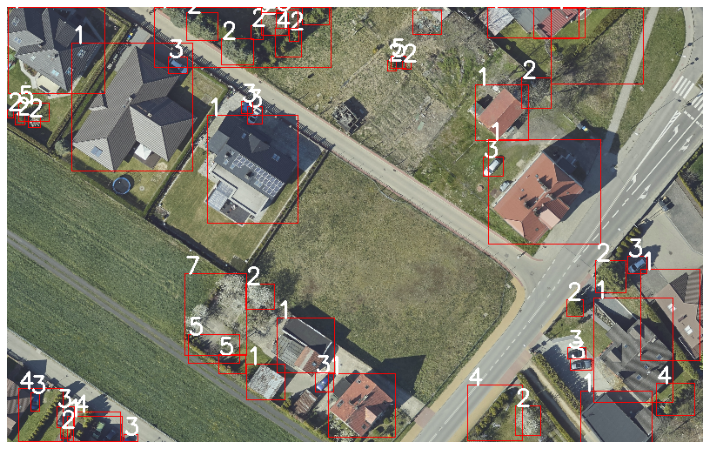

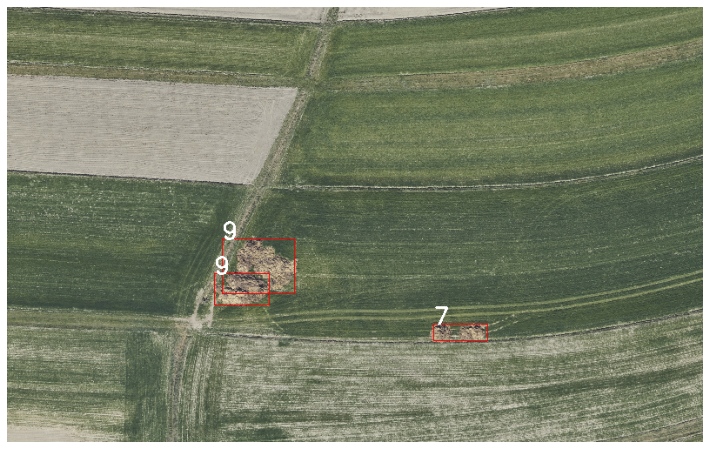

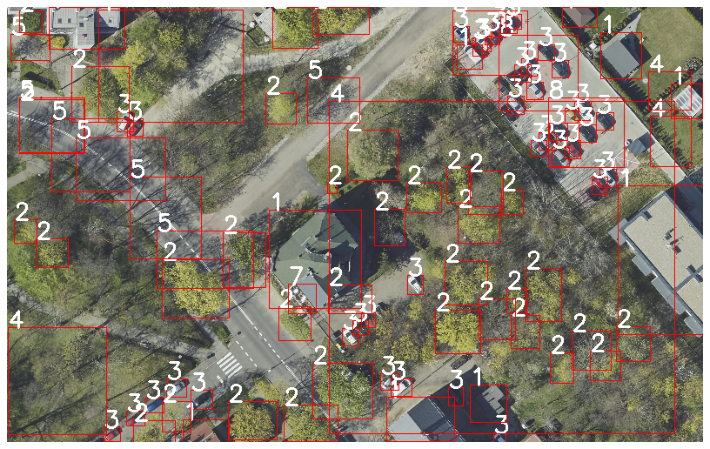

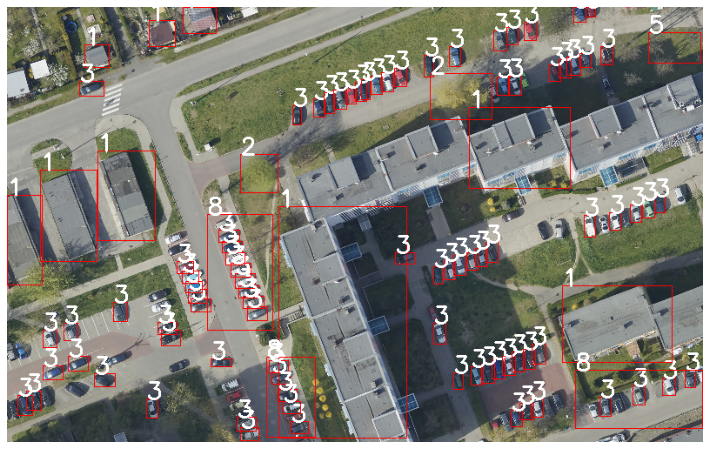

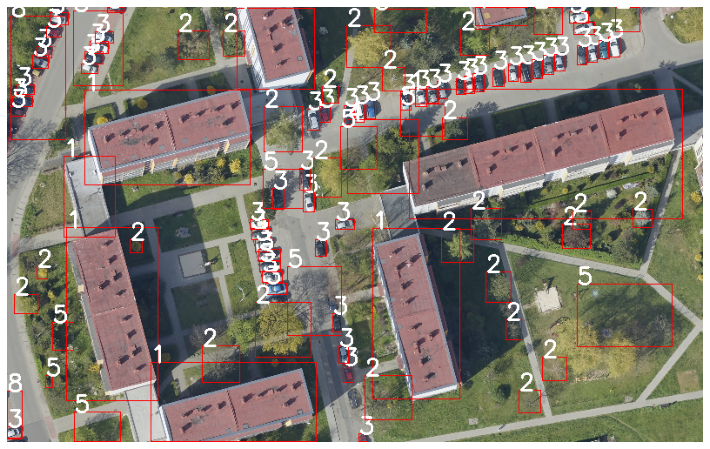

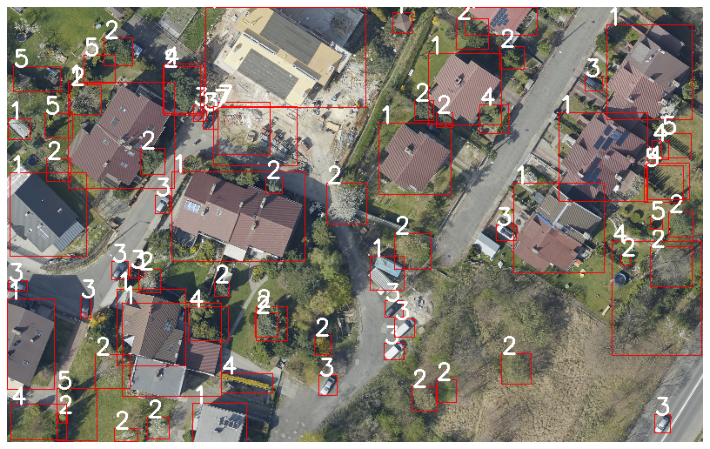

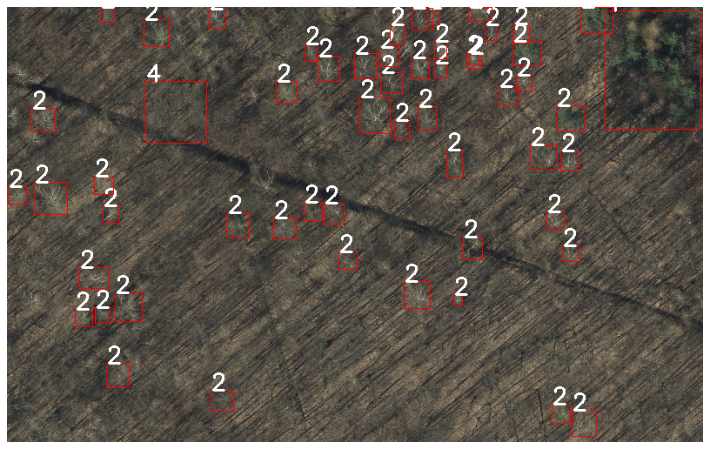

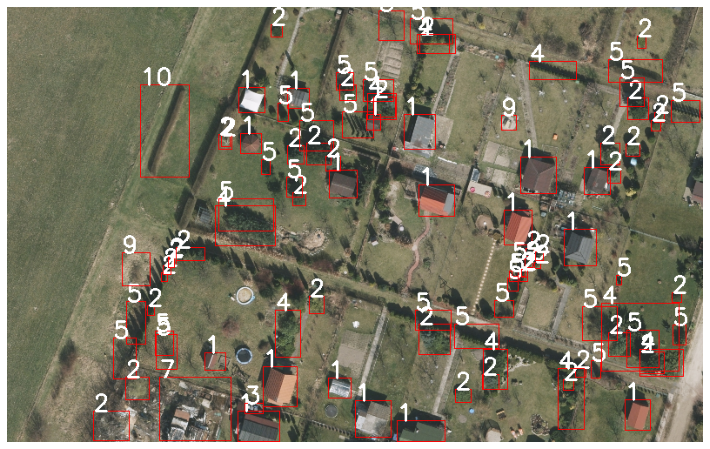

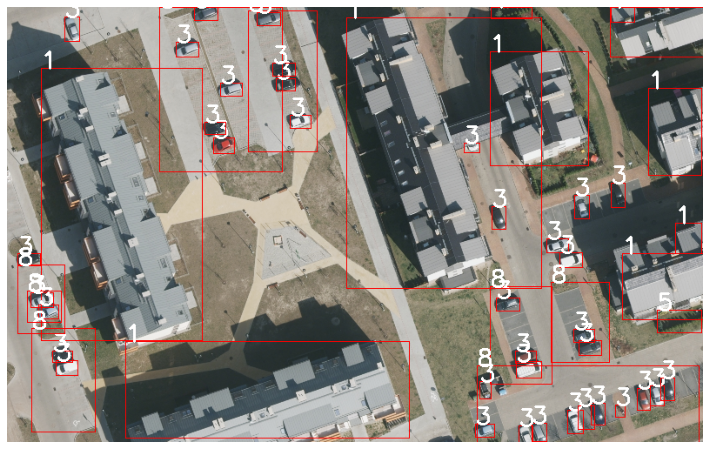

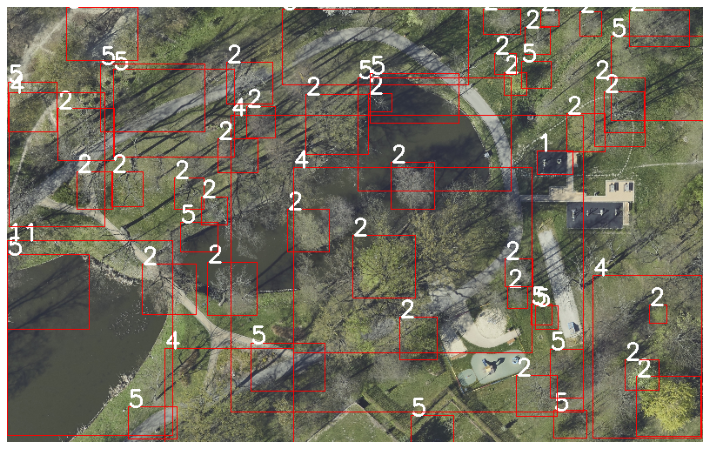

In [6]:
# model.load_state_dict(torch.load(
#     'fasterrcnn_resnet50_fpn.pth', map_location=torch.device('cpu')))
model.eval()

# images, targets, image_ids = next(iter(valid_data_loader))

y_pred = []
y_true = []

for images, targets, image_ids in valid_data_loader:
    images = list(img.to(device) for img in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    
    outputs = model(images)
    outputs = [{k: v.to(device) for k, v in t.items()} for t in outputs]
    print(outputs)
    fig, ax = plt.subplots(1, 1, figsize=(16, 8))
    boxes = outputs[0]['boxes'].cpu().detach().numpy().astype(np.int32)
    labels = outputs[0]['labels'].cpu().detach().numpy().astype(np.int32)
    sample = images[0].permute(1,2,0).cpu().detach().numpy()
    scores = outputs[0]['scores'].cpu().detach().numpy().astype(np.float16)
    y_pred.extend(labels)
    y_true.extend(targets[0]['labels'].cpu().detach().numpy().astype(np.int32))
    
    for i, box in enumerate(boxes):
        if scores[i] < 0.4:
            continue
        cv2.rectangle(sample,
                      (box[0], box[1]),
                      (box[2], box[3]),
                      (220, 0, 0), 1)
        cv2.putText(sample, str(labels[i]), (box[0], box[1]),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36, 255, 12), 2)
    ax.set_axis_off()
    ax.imshow(sample)




In [7]:
for images, targets, image_ids in valid_data_loader:
    images = list(img.to(device) for img in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    print(targets)

[{'boxes': tensor([[1.0650e+02, 4.8300e+02, 1.2925e+02, 5.0000e+02],
        [1.3175e+02, 4.9500e+02, 1.4375e+02, 5.0000e+02],
        [9.7750e+01, 4.7550e+02, 1.1400e+02, 4.9675e+02],
        [5.6000e+01, 4.6100e+02, 7.4500e+01, 4.8375e+02],
        [2.7500e+01, 4.4175e+02, 3.7750e+01, 4.6275e+02],
        [3.5550e+02, 4.2225e+02, 3.7425e+02, 4.4175e+02],
        [2.6650e+02, 1.0800e+02, 2.8125e+02, 1.2750e+02],
        [2.7500e+02, 1.1450e+02, 2.9325e+02, 1.3600e+02],
        [1.8375e+02, 5.8500e+01, 2.0900e+02, 7.7500e+01],
        [5.4700e+02, 1.7450e+02, 5.6800e+02, 1.9525e+02],
        [7.1250e+02, 2.8750e+02, 7.3750e+02, 3.0725e+02],
        [6.4450e+02, 4.0525e+02, 6.7350e+02, 4.1950e+02],
        [6.4200e+02, 3.9125e+02, 6.6400e+02, 4.0500e+02],
        [0.0000e+00, 0.0000e+00, 1.0800e+02, 9.8500e+01],
        [7.2500e+01, 4.4000e+01, 2.1975e+02, 1.9100e+02],
        [2.2725e+02, 1.1825e+02, 3.3300e+02, 2.4275e+02],
        [0.0000e+00, 4.2625e+02, 3.0500e+01, 4.9300e+02],
   

[{'boxes': tensor([[422.5000, 125.7500, 537.5000, 226.5000],
        [331.7500, 161.7500, 447.0000, 252.7500],
        [527.5000, 114.0000, 643.0000, 213.7500],
        [312.7500, 242.2500, 407.2500, 357.7500],
        [348.7500, 339.0000, 444.7500, 454.7500],
        [631.5000, 101.0000, 748.5000, 204.0000],
        [728.0000,  74.5000, 798.0000, 168.0000],
        [633.5000, 320.2500, 747.0000, 410.0000],
        [665.0000, 319.0000, 800.0000, 478.2500],
        [384.0000, 436.5000, 469.5000, 499.7500],
        [ 37.5000, 191.5000, 101.7500, 289.7500],
        [105.5000, 167.0000, 167.7500, 266.0000],
        [ 27.0000,  61.5000,  48.5000,  82.5000],
        [ 89.5000,  44.7500, 115.2500,  69.5000],
        [163.0000,  17.5000, 192.7500,  46.2500],
        [205.0000,   0.0000, 242.7500,  29.7500],
        [351.5000, 427.5000, 359.5000, 436.0000],
        [354.2500, 437.0000, 364.0000, 445.0000],
        [359.0000, 445.5000, 368.2500, 453.7500],
        [362.0000, 456.5000, 370.2500, 

[{'boxes': tensor([[4.5500e+02, 1.6000e+02, 5.4400e+02, 2.3675e+02],
        [5.2800e+02, 1.4100e+02, 6.1850e+02, 2.2150e+02],
        [6.0700e+02, 1.2150e+02, 6.9450e+02, 2.0350e+02],
        [6.8000e+02, 1.0100e+02, 7.6600e+02, 1.8300e+02],
        [4.2275e+02, 2.6175e+02, 4.9450e+02, 3.5875e+02],
        [4.3925e+02, 3.4625e+02, 5.1750e+02, 4.5250e+02],
        [6.8000e+01, 2.5500e+02, 1.5000e+02, 3.5675e+02],
        [9.0500e+01, 3.3875e+02, 1.7250e+02, 4.4475e+02],
        [1.7550e+02, 4.1525e+02, 3.5125e+02, 4.9975e+02],
        [9.1000e+01, 1.1750e+02, 1.9375e+02, 2.0575e+02],
        [1.7825e+02, 9.3250e+01, 2.8050e+02, 1.8300e+02],
        [2.6325e+02, 5.0000e-01, 3.5050e+02, 9.9750e+01],
        [2.8950e+02, 3.3700e+02, 3.4275e+02, 3.9975e+02],
        [2.5025e+02, 3.5500e+02, 2.8825e+02, 4.0200e+02],
        [1.7675e+02, 3.9650e+02, 1.9075e+02, 4.1050e+02],
        [1.9250e+02, 2.5325e+02, 2.1200e+02, 2.6850e+02],
        [3.0250e+02, 4.0275e+02, 3.1250e+02, 4.1375e+02],
   

[{'boxes': tensor([[7.7700e+02, 5.0000e-01, 8.0000e+02, 2.1000e+01],
        [6.5850e+02, 0.0000e+00, 6.9700e+02, 3.1250e+01],
        [7.1400e+02, 0.0000e+00, 7.3400e+02, 1.2000e+01],
        [7.5000e+02, 2.5500e+01, 7.7700e+02, 5.5250e+01],
        [7.0700e+02, 1.3750e+01, 7.2750e+02, 3.5250e+01],
        [7.2650e+02, 1.2750e+01, 7.5800e+02, 5.3500e+01],
        [6.9500e+02, 3.2000e+01, 7.3100e+02, 6.7500e+01],
        [7.2950e+02, 5.4750e+01, 7.5800e+02, 7.7250e+01],
        [7.6500e+02, 2.2025e+02, 7.8600e+02, 2.4150e+02],
        [6.1800e+02, 2.3175e+02, 6.4650e+02, 2.5550e+02],
        [6.1600e+02, 2.5550e+02, 6.3400e+02, 2.7475e+02],
        [6.3400e+02, 2.7050e+02, 6.5750e+02, 2.8925e+02],
        [6.3300e+02, 2.5075e+02, 6.5100e+02, 2.6850e+02],
        [6.2400e+02, 3.3425e+02, 6.4200e+02, 3.4900e+02],
        [5.9200e+02, 3.4375e+02, 6.1150e+02, 3.6075e+02],
        [6.3650e+02, 1.6175e+02, 6.5900e+02, 1.9175e+02],
        [6.0200e+02, 1.5250e+02, 6.3450e+02, 1.8725e+02],
   

[{'boxes': tensor([[687.5000,   0.0000, 800.0000,  66.3125],
        [735.0000,  90.0000, 800.0000, 191.1250],
        [685.5000, 242.1250, 800.0000, 366.5000],
        [136.5000, 382.0000, 458.7500, 500.0000],
        [ 27.9062,  74.1250, 217.5000, 396.5000],
        [385.2500,   7.2031, 672.0000, 331.2500],
        [555.5000, 226.8750, 577.5000, 259.0000],
        [634.5000, 282.2500, 664.5000, 302.0000],
        [619.5000, 264.2500, 648.5000, 283.7500],
        [612.0000, 196.5000, 740.0000, 262.7500],
        [625.5000, 319.2500, 684.5000, 409.2500],
        [556.0000, 323.2500, 620.0000, 429.2500],
        [703.5000, 405.2500, 800.0000, 473.7500],
        [528.0000, 450.7500, 573.5000, 498.5000],
        [574.5000, 443.5000, 707.0000, 500.0000],
        [529.0000, 417.2500, 578.5000, 453.7500],
        [ 39.3125, 373.2500, 105.0000, 491.7500],
        [  3.3008, 277.0000,  60.6250, 364.5000],
        [211.2500,   0.0000, 359.7500, 176.3750],
        [170.3750,   6.9023, 264.2500, 

IndexError: index 54 is out of bounds for axis 0 with size 54

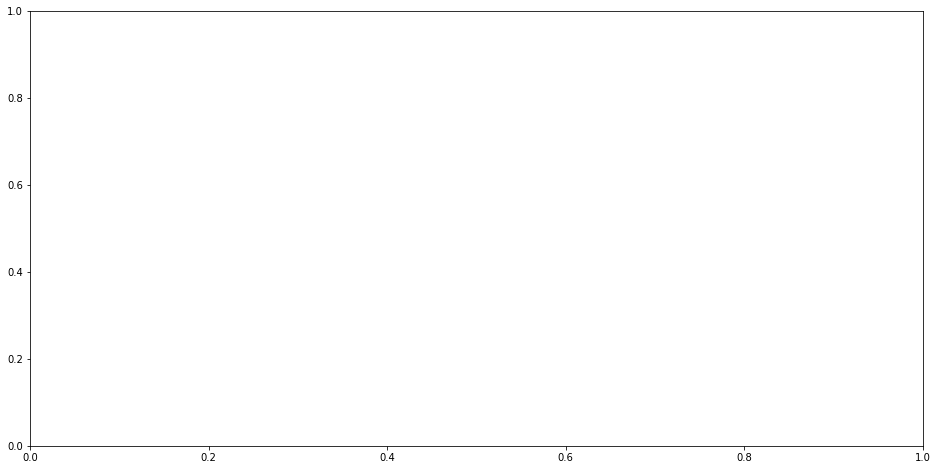

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
labels = targets[0]['labels'].cpu().numpy().astype(np.int32)
for i, box in enumerate(boxes):
    cv2.rectangle(sample,
                  (box[0], box[1]),
                  (box[2], box[3]),
                  (220, 0, 0), 1)
    cv2.putText(sample, str(labels[i]), (box[0], box[1]),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36, 255, 12), 2)
ax.set_axis_off()
ax.imshow(sample)

In [ ]:
outputs

In [ ]:
boxes = outputs[0]['boxes'].cpu().detach().numpy().astype(np.int32)
labels = outputs[0]['labels'].cpu().detach().numpy().astype(np.int32)
scores = outputs[0]['scores'].cpu().detach().numpy().astype(np.float16)
print(scores)
fig1, ax1 = plt.subplots(1, 1, figsize=(16, 8))

for i, box in enumerate(boxes):
    if scores[i] < 0.4:
        continue
    cv2.rectangle(sample,
                  (box[0], box[1]),
                  (box[2], box[3]),
                  (220, 0, 0), 1)
    label = str(labels[i]) + '-' + str(int(scores[i] * 100))
    print(label)
    cv2.putText(sample, label, (box[0], box[1]),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36, 255, 12), 2)
ax1.set_axis_off()
ax1.imshow(sample)

In [ ]:
len([0.9836, 0.9797, 0.9663, 0.9627, 0.9620, 0.9477, 0.9351, 0.9327, 0.9273,
          0.9239, 0.9035, 0.8862, 0.8751, 0.8405, 0.7973, 0.7900, 0.7841, 0.7826,
          0.7713, 0.7250, 0.7018, 0.6980, 0.6621, 0.6601, 0.5947, 0.5860, 0.5460,
          0.5253, 0.5248, 0.5235, 0.5081, 0.5059, 0.5034, 0.5000])

In [ ]:
boxes = outputs[0]['boxes'].cpu().detach().numpy().astype(np.int32)
labels = outputs[0]['labels'].cpu().detach().numpy().astype(np.int32)
scores = outputs[0]['scores'].cpu().detach().numpy().astype(np.float16)
sample1 = images[0].permute(1,2,0).cpu().numpy()

fig2, ax2 = plt.subplots(1, 1, figsize=(16, 8))

for i, box in enumerate(boxes):
    cv2.rectangle(sample1,
                  (box[0], box[1]),
                  (box[2], box[3]),
                  (220, 0, 0), 1)
    label = str(labels[i]) + '-' + str(int(scores[i] * 100))
    print(label)
    cv2.putText(sample1, label, (box[0], box[1]),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (36, 255, 12), 2)
ax2.set_axis_off()
ax2.imshow(sample1)

In [ ]:
len(images)

In [9]:
torch.save(model.state_dict(), './model_nice.pth')

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sn

cf_matrix = confusion_matrix(y_true, y_pred)
df_cm = pd.DataFrame(cf_matrix/np.sum(cf_matrix) *10, index = [i for i in classes],
                     columns = [i for i in classes])
plt.figure(figsize = (12,7))
sn.heatmap(df_cm, annot=True)
plt.savefig('output.png')

In [ ]:
images, targets, image_ids = next(iter(valid_data_loader))
images = list(image.to(device) for image in images)
targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

# try:
loss_dict = model(images, targets)
print(loss_dict)
losses = sum(loss for loss in loss_dict.values())
loss_value = losses.item()
print(losses)
print(loss_value)